<a href="https://colab.research.google.com/github/playlikepossum/DLCW24/blob/main/DL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Week 2 Lab: Experiments with basic networks  and visualising the results


In [ ]:
#@title
from __future__ import division, print_function, unicode_literals
from google.colab import files

# Common imports
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import seaborn as sns

# to make this notebook's output stable across runs
def reset_graph(seed=42):
    tf.reset_default_graph()
    tf.set_random_seed(seed)
    np.random.seed(seed)

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize']  = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Where to save the figures
PROJECT_ROOT_DIR = "."
try:
  os.mkdir(os.path.join(PROJECT_ROOT_DIR, "images"))
except FileExistsError:
  pass

def save_fig(fig, tight_layout=True):
    fig_id = fig.number
    path = os.path.join(PROJECT_ROOT_DIR, "images", str(fig_id) + ".png")
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format='png', dpi=300)
    files.download(path)

# Visualising simple networks

Let's try running some simple multi-layer perceptrons and see how they perform some basic regression and classification tasks. The goal here is to give you some insight into how a network represents the function or classifier, and what the impact of changing the parameters is.


# Regression

We can start with a one dimensional regression task. A target system is $$ y = \sin(10\pi x\sin((x-0.5)^3))+\epsilon, $$where $\epsilon \sim \cal{N}(\mu, \sigma)$, and $\mu=0, \sigma=0.1$.


Saving figure 1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

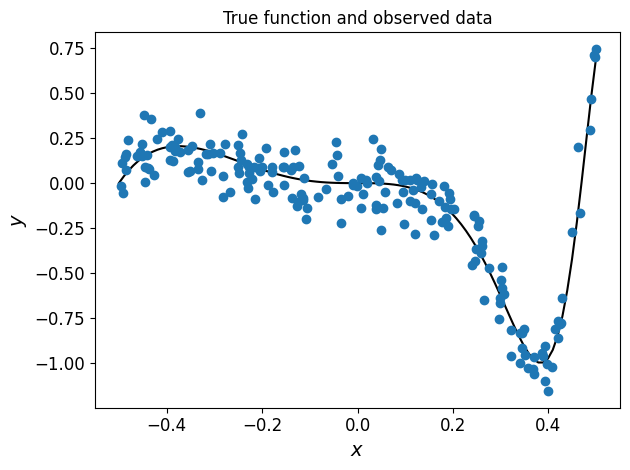

In [ ]:
import math

def testfunc(x):
    #y = np.sin((4*math.pi*x**2))
    y = -np.sin((10*math.pi*(x+0.5)*np.sin((x)**3)))
    return y


xgrid = torch.t(torch.linspace(-0.5,0.5,100)).unsqueeze(1)
ytrue = testfunc(xgrid) # clean data from underlying function (not available for learning)

# now create some training data
N = 200         # number of noisy training observations made
noiseSigma = 0.1   # standard deviation of noise
noiseMean = 0.0    # mean of noise

x = torch.rand_like(torch.ones(N,1))-0.5
obserr = torch.randn(N,1)*noiseSigma + noiseMean
y = testfunc(x)+obserr

xtest  = torch.rand_like(torch.ones(N,1))-0.5
obserr = torch.randn(N,1)*noiseSigma + noiseMean
ytest  = testfunc(xtest)+obserr

fig = plt.figure()
plt.plot(xgrid, ytrue,'-k')
plt.plot(x,y,'o')
plt.title('True function and observed data')
plt.xlabel('$x$')
plt.ylabel('$y$')

save_fig(fig)



> Indented block


.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

Nhidden = 10
lamb = 0.001
lr = 0.01
epochs = 1000
batch_size = 64

class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()

        # an affine operation: y = Wx + b
        self.fc1 = nn.Linear(1, Nhidden)  # See https://pytorch.org/docs/stable/nn.html#linear for documentation
        self.fc2 = nn.Linear(Nhidden, 1)  # Can you find out how the weights are initialised? Look in the source code https://github.com/pytorch/pytorch/blob/master/torch/nn/modules/linear.py

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

net = Net()
print(net)

criterion = nn.MSELoss()
optimizer = optim.SGD(net.parameters(), lr=lr, momentum=0.9, weight_decay=lamb)


for epoch in range(20000):  # loop over the dataset multiple times
    running_loss = 0.0

    # zero the parameter gradients
    optimizer.zero_grad()

    # forward + backward + optimize
    outputs = net(x)
    loss = criterion(outputs, y)
    loss.backward()
    optimizer.step()

    # print statistics
    running_loss += loss.item()
    if epoch % 2000 == 1999:    # print every 2000 mini-batches
        print('[%d, %5d] loss: %.3f' %
              (epoch + 1, 0 + 1, running_loss))
        running_loss = 0.0

print('Finished Training')



Net(
  (fc1): Linear(in_features=1, out_features=10, bias=True)
  (fc2): Linear(in_features=10, out_features=1, bias=True)
)
[2000,     1] loss: 0.090
[4000,     1] loss: 0.082
[6000,     1] loss: 0.078
[8000,     1] loss: 0.074
[10000,     1] loss: 0.062
[12000,     1] loss: 0.045
[14000,     1] loss: 0.033
[16000,     1] loss: 0.027
[18000,     1] loss: 0.023
[20000,     1] loss: 0.021
Finished Training


Text(0.5, 1.0, 'Regression comparison')

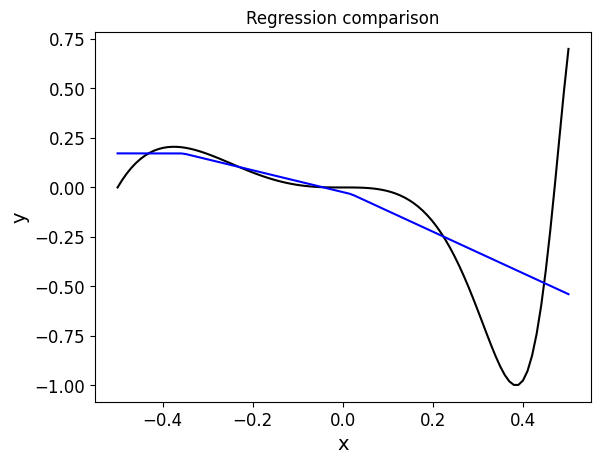

In [ ]:
pred_y = net(x)
pred_ygrid =net(xgrid)

plt.figure()
plt.plot(xgrid, ytrue,'k-')
plt.plot(xgrid, pred_ygrid.detach().numpy(),'b-')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Regression comparison')

You can view the values of the layers as a list of numpy arrays using the [get_weights() ](https://keras.io/layers/about-keras-layers/) command in keras. Each layer can be accessed independently




In [ ]:
print('First hidden layer weights', torch.t(net.fc1.weight)) # first hidden layer weights (transposed for ease of inspection)
print('First hidden layer biases', net.fc1.bias) # first hidden layer biases
print('Second layer weights',net.fc2.weight) # second layer
print('Second layer bias', net.fc2.bias) # second layer

First hidden layer weights tensor([[ 0.0103,  0.0065,  0.2865,  0.6661, -0.0369, -0.1195,  0.7102, -0.0650,
         -0.0296, -0.0313]], grad_fn=<TBackward0>)
First hidden layer biases Parameter containing:
tensor([-0.0997,  0.1306,  0.1018,  0.2358,  0.0691, -0.1213, -0.0133, -0.1029,
        -0.0971,  0.0337], requires_grad=True)
Second layer weights Parameter containing:
tensor([[-0.0283,  0.0502, -0.3054, -0.6939,  0.0357,  0.0058, -0.7006, -0.0212,
          0.0158,  0.0373]], requires_grad=True)
Second layer bias Parameter containing:
tensor([0.1608], requires_grad=True)


Your task is to train a multilayer network with a single hidden layer to fit this function from the noisy data.


1.   Experiment with the number of units in the model, and the impact of choice of activation function, number of training data, and noise levels on the data.
2.   Plot a visualisation of the network output at `xgrid` inputs, and compare it with the `ytrue` results..
3.   Plot the responses of all the activation functions in the model and see how they change behaviour during learning and as the parameters change


# Classification task

Now we will try out some experiments with simple two-dimensional classification tasks.


**Dataset 1**


171


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Text(0, 0.5, '$x_2$')

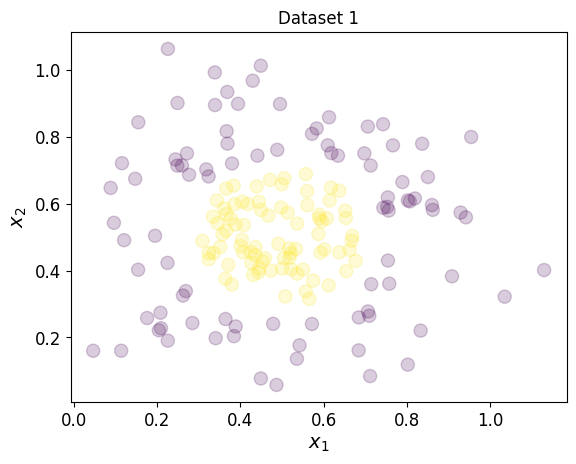

In [ ]:
N = 200

xgrid = torch.arange(0,1.0,0.01)

X,Y = torch.meshgrid(xgrid, xgrid)
testgrid = torch.zeros((np.shape(xgrid)[0]**2,2))
testgrid[:,0] = X.flatten()
testgrid[:,1] = Y.flatten()


#try experimenting with different types of input distribution
#x = np.random.uniform(low = 0.0, high = 1.0, size= (N,2))
x = 0.2*torch.randn(N,2)+torch.tensor([0.5, 0.5])
y = ((torch.norm(x-0.5, dim=1) < 0.2)*1.0).type(torch.float)  # make the class be a circle in the centre of the scene.

# cut out a border around the classes to make the task a bit more realistic
ind_incl = (torch.norm(x-0.5, dim=1) > 0.25) | (torch.norm(x-0.5, dim=1) < 0.20)
x = x[ind_incl,:]
y = y[ind_incl]
N = y.shape[0]
y = y.reshape(N,1)
print(N)

Ntest = 1000
xtest = 0.2*torch.randn(Ntest,2)+torch.tensor([0.5, 0.5])
ytest = ((torch.norm(xtest-0.5, dim=1) < 0.2)*1.0).type(torch.float)

# cut out a border around the classes to make the task a bit more realistic
ind_incl = (torch.norm(xtest-0.5, dim=1) > 0.25) | (torch.norm(xtest-0.5, dim=1) < 0.20)
xtest = xtest[ind_incl,:]
ytest = ytest[ind_incl]

Ntest = ytest.shape[0]
ytest = ytest.reshape(Ntest,1)

plt.figure()
plt.scatter(x[:,0].numpy(),x[:,1].numpy(), alpha=0.2, s=90, cmap='viridis', c=y.view(-1))
plt.title('Dataset 1')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')

In [ ]:
Nhidden = 10
lamb=0.00001    # L2 weight decay term
lr = 0.01
epochs = 300
batch_size = 64


class Net2d(nn.Module):
    def __init__(self):
        super(Net2d, self).__init__()
        # an affine operation: y = Wx + b
        self.fc1 = nn.Linear(2, Nhidden)
        self.fc2 = nn.Linear(Nhidden, Nhidden)
        self.fc3 = nn.Linear(Nhidden, 1)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = torch.sigmoid(self.fc3(x))
        return x

net2d = Net2d()
print(net2d)



Net2d(
  (fc1): Linear(in_features=2, out_features=10, bias=True)
  (fc2): Linear(in_features=10, out_features=10, bias=True)
  (fc3): Linear(in_features=10, out_features=1, bias=True)
)


In [ ]:
criterion = nn.BCELoss()
optimizer = optim.SGD(net2d.parameters(), lr=lr, momentum=0.9, weight_decay=lamb) # Note that this is adding L2 regularisation with factor lamb to every parameter

for epoch in range(20000):  # loop over the dataset multiple times
    running_loss = 0.0

    # zero the parameter gradients
    optimizer.zero_grad()

    # forward + backward + optimize
    outputs = net2d(x)
    loss = criterion(outputs, y)
    loss.backward()
    optimizer.step()

    # print statistics
    running_loss += loss.item()
    if epoch % 2000 == 1999:    # print every 2000 mini-batches
        print('[%d, %5d] loss: %.3f' %
              (epoch + 1, 0 + 1, running_loss))
        running_loss = 0.0



[2000,     1] loss: 0.153
[4000,     1] loss: 0.027
[6000,     1] loss: 0.012
[8000,     1] loss: 0.007
[10000,     1] loss: 0.005
[12000,     1] loss: 0.004
[14000,     1] loss: 0.003
[16000,     1] loss: 0.003
[18000,     1] loss: 0.002
[20000,     1] loss: 0.002


Btw, an alternative, simple way to create basic networks is with the `nn.Sequential` container

Final training set loss  0.0020500642713159323
Test loss  0.03426653519272804
Percentage correct  99.05992889404297


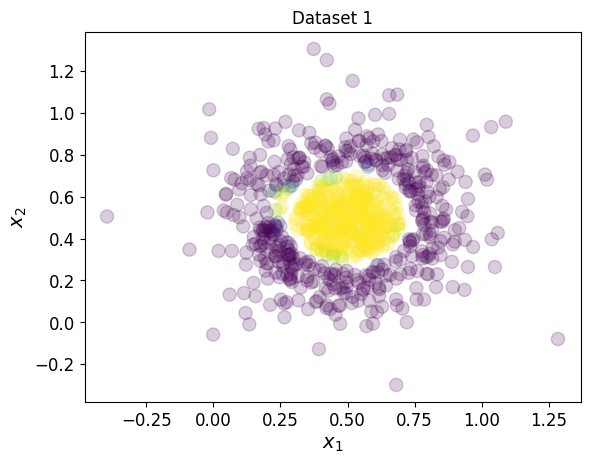

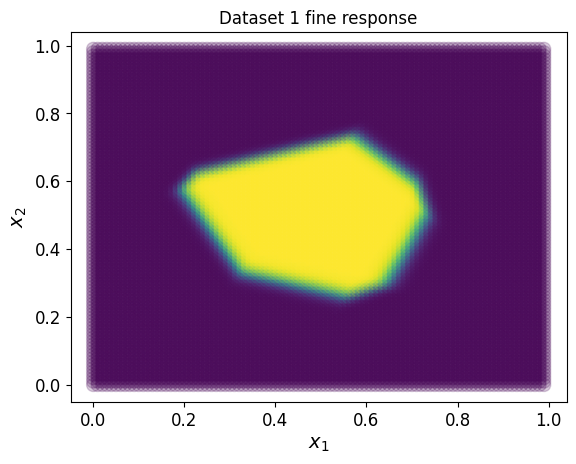

In [ ]:
pred_test = net2d(xtest)
plt.figure()
plt.scatter(xtest[:,0],xtest[:,1], alpha=0.2, s=90, cmap='viridis', c=pred_test[:,0].detach().numpy())
plt.title('Dataset 1')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')

pred_testgrid = net2d(testgrid)
plt.figure()
plt.scatter(testgrid[:,0],testgrid[:,1], alpha=0.2, s=90, cmap='viridis', c=pred_testgrid[:,0].detach().numpy())
plt.title('Dataset 1 fine response')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')

print('Final training set loss ', criterion(outputs, y).item())
test_loss = criterion(pred_test, ytest)
print('Test loss ', test_loss.item())
classification = torch.round(pred_test)
percentage = 100*sum(ytest.type(torch.int) == classification.type(torch.int))/Ntest
print('Percentage correct ', percentage.item())

In [ ]:
net2d = nn.Sequential(nn.Linear(2,Nhidden),
                      nn.Sigmoid(),
                      nn.Linear(Nhidden, 1),
                      nn.Sigmoid())
net2d

Sequential(
  (0): Linear(in_features=2, out_features=10, bias=True)
  (1): Sigmoid()
  (2): Linear(in_features=10, out_features=1, bias=True)
  (3): Sigmoid()
)

Try repeating these experiments with the following variations:
- Try with 200, 500, 2000 training points. How does that change the response of the function?
- try with Sigmoids in the hidden layer rather than ReLUs.
    - How does that change the shape of the decision boundary? Why do you think this is?
    - How does it change the speed of error reduction?
- try changing the number of hidden units. What changes?
    - Do you see as many 'edges' on the decision boundary when using ReLUs as units? Why do you think this is?
- try with 1,2,3 hidden layers.
- what happens if you increase `lamb`?
    - what happens to lowest error achieved in training?
    - what happens to the shape of the decision boundary?
    - what happens to the speed of learning?
- during the above you may find that some configurations take a lot longer to reduce the error than others.


Try changing the loss function from Binary Cross-Entropy (`BCEloss`) to `MSEloss`. How does that affect performance? How does it affect perfomance in `mse`? Your choice of cost function is linked to the output type, as shown in the table below:
![output/cost function table](https://docs.google.com/uc?export=download&id=1Z2C-NJh35shzvtMlvEtDpyQgGM10bvew)


Try increasing the number of training data, and changing the network architecture.


Text(0, 0.5, '$x_2$')

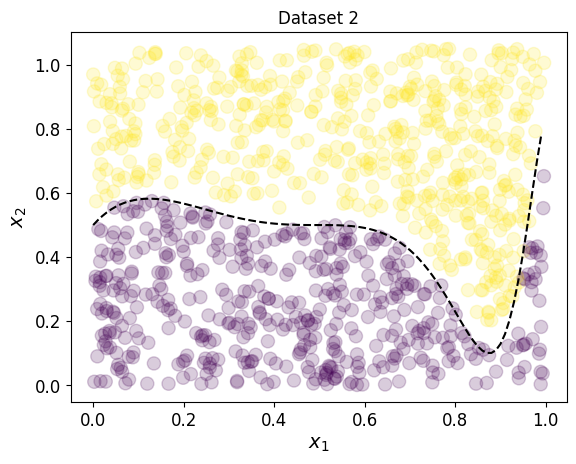

In [ ]:
N = 1000

xgrid1 = torch.arange(0,1.0,0.01)

#try experimenting with different types of input distribution
data_dist = 1 # 1 - uniform 0.5-0.5, 2 - normally distributed

if data_dist == 1:
   x = torch.rand(N,2)
else:
   x = 0.15*torch.randn(N,2)+torch.tensor([0.5, 0.5])
ind_pos = (0.5+0.4*testfunc(x[:,0]-0.5)<x[:,1])
y = (ind_pos*1.0).type(torch.float)  # lets create a classification line based on old regression function
N = y.shape[0]
y = y.reshape(N,1)
x[ind_pos,1] = x[ind_pos,1]+0.05 # create a gap between classes.


if data_dist == 1:
  xtest = torch.rand(N,2)
else:
  xtest = 0.15*torch.randn(N,2)+torch.tensor([0.5, 0.5])
ind_post = (0.5+0.4*testfunc(xtest[:,0]-0.5)<xtest[:,1])
ytest = (ind_post*1.0).type(torch.float)  # let's create a classification line based on old regression function
Ntest = ytest.shape[0]
ytest = ytest.reshape(Ntest,1)
xtest[ind_post,1] = xtest[ind_post,1]+0.05 # create a gap between classes.


plt.figure()
plt.scatter(x[:,0],x[:,1], alpha=0.2, s=90, cmap='viridis', c=y.view(-1))
plt.plot(xgrid1, 0.5+0.4*ytrue,'--k')  # show the 'true' classification line for this problem
plt.title('Dataset 2')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')



In [ ]:


Nhidden = 20
lamb=0.001
lr = 0.01
epochs = 1000
batch_size = 64

net2d = nn.Sequential(nn.Linear(2,Nhidden),
                      nn.ReLU(),
                      nn.Linear(Nhidden, Nhidden),
                      nn.ReLU(),
                      nn.Linear(Nhidden, 1),
                      nn.Sigmoid())
#reuse net2d


In [ ]:
criterion = nn.BCELoss()
optimizer = optim.SGD(net2d.parameters(), lr=lr, momentum=0.9, weight_decay=lamb) # Note that this is adding L2 regularisation with factor lamb to every parameter

for epoch in range(20000):  # loop over the dataset multiple times
    running_loss = 0.0

    # zero the parameter gradients
    optimizer.zero_grad()

    # forward + backward + optimize
    outputs = net2d(x)
    loss = criterion(outputs, y)
    loss.backward()
    optimizer.step()

    # print statistics
    running_loss += loss.item()
    if epoch % 2000 == 1999:    # print every 2000 mini-batches
        print('[%d, %5d] loss: %.3f' %
              (epoch + 1, 0 + 1, running_loss))
        running_loss = 0.0

[2000,     1] loss: 0.134
[4000,     1] loss: 0.115
[6000,     1] loss: 0.096
[8000,     1] loss: 0.080
[10000,     1] loss: 0.069
[12000,     1] loss: 0.061
[14000,     1] loss: 0.055
[16000,     1] loss: 0.050
[18000,     1] loss: 0.045
[20000,     1] loss: 0.043


Final training set loss  0.04256713017821312
Test loss  0.038498345762491226
Percentage correct  98.69999694824219


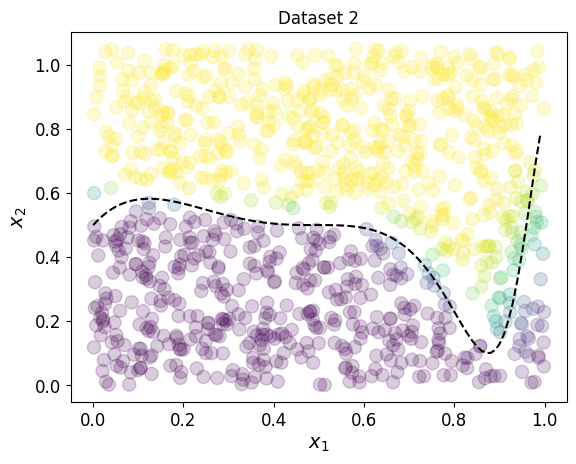

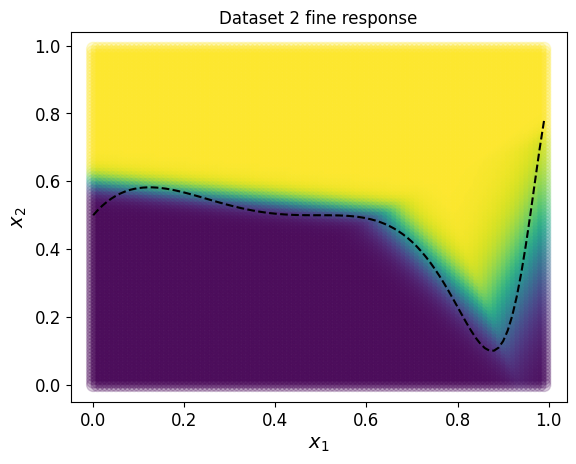

In [ ]:
pred_test = net2d(xtest)
plt.figure()
plt.scatter(xtest[:,0],xtest[:,1], alpha=0.2, s=90, cmap='viridis', c=pred_test[:,0].detach().numpy())
plt.plot(xgrid1, 0.5+0.4*ytrue,'--k')  # show the 'true' classification line for dataset2 problem
plt.title('Dataset 2')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')

pred_testgrid = net2d(testgrid)
plt.figure()
plt.scatter(testgrid[:,0],testgrid[:,1], alpha=0.2, s=90, cmap='viridis', c=pred_testgrid[:,0].detach().numpy())
plt.plot(xgrid1, 0.5+0.4*ytrue,'--k')  # show the 'true' classification line for this problem
plt.title('Dataset 2 fine response')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')

print('Final training set loss ', criterion(outputs, y).item())
test_loss = criterion(pred_test, ytest)
print('Test loss ', test_loss.item())
classification = torch.round(pred_test)
percentage = 100.0*torch.sum(ytest.type(torch.int) == classification.type(torch.int))/Ntest
print('Percentage correct ', percentage.item())

Try changing the distribution of the training data (e.g. make it normally distributed) but keeping the same classification boundary. How does that change the resulting classification boundary?

# Homework

Work your way through the Colab file and experiment with the network architectures.


**bold text**# Week 3 lab: Convolutional networks

This week we will get some hands-on experience with convolutional networks on 2D images.

After this lab, you should:

*   Understand how to build and train a convolutional neural network in Pytorch
*   Know how to change the numbers and parameters of layers
*   Have a point of comparison for the relative performance of fully connected vs. convolutional networks on a realistic dataset

First, we will set up a few things:

In [ ]:
#@title
from __future__ import division, print_function, unicode_literals
from google.colab import files

# Common imports
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import seaborn as sns

# to make this notebook's output stable across runs
def reset_graph(seed=42):
    tf.reset_default_graph()
    tf.set_random_seed(seed)
    np.random.seed(seed)

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize']  = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "pytorch"

# make sure you use the GPU (btw check your runtime is a GPU in colab)
use_cuda = True
device = torch.device("cuda" if (use_cuda and torch.cuda.is_available()) else "cpu")


def save_fig(fig_id, tight_layout=True):
    path = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID, fig_id + ".png")
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format='png', dpi=300)
    files.download(PROJECT_ROOT_DIR+'/images/'+CHAPTER_ID+'/'+fig_id + ".png")

Now you need to define the network properties. Fill in the missing structure to implement (1) a multi-layer linear, dense network for `model_dense` and (2) a multi-layer convolutional network for `model_conv`. You should know how to build the dense architecture from the last two weeks. Note we suggest the use of the `nn.Sequential` object, the use of an `OrderedDict` structure will allow you to name each layer, for clearer display when you print your model.  

For the convnet, remember that the output of every `Conv2d` and `MaxPool2d` layer is a 3D tensor of shape *(height, width, channels)*. The *width* and *height* dimensions tend to shrink as we go deeper in the network (you can use the `padding` parameter to counteract this). The number of channels is controlled by the first argument passed to the Conv2D layers (e.g. 32 or 64). Remember to check the impact of padding parameters and maxpooling output dimensions when structuring the dimensions of the conv2d layers.

The next step would be to feed our last output tensor (of shape (X, Y, N)) into a densely-connected classifier network like those you are already familiar with: a stack of Dense layers. These classifiers process vectors, which are 1D, whereas our current output is a 3D tensor. So first, we will have to flatten our 3D outputs to 1D (you can use `nn.Flatten` for this), and then add a few Dense layers after that (be careful to set the correct number of inputs for the dense layers, some calculations by hand are required here!).

We are going to do 10-way classification, so use a final layer with 10 outputs and a `nn.Softmax` activation.

I would suggest to start with *small* models: it will make the training faster. You can always push a bit the parameters for your last experiments at the end.

In [ ]:
import collections

# fully connected model
model_dense = nn.Sequential(collections.OrderedDict([
...       # fill in structure
        ]))

# convolutional model
model_conv = nn.Sequential(collections.OrderedDict([
...        # fill in structure
        ]))

TypeError: 'ellipsis' object is not iterable

Now here's what our network looks like:

In [ ]:
print(model)

Now, let's train our convnet on the Fashion MNIST digits. You can[ learn more about the Fashion-MNIST data set](https://github.com/zalandoresearch/fashion-mnist).

We specify the root directory to store the dataset, download the training data, if not present on the local machine, and then apply the transforms. ToTensor to turn images into Tensor so we can directly use it with our network. The dataset is stored in the dataset class named `train_set` and the test data in (unsurprisingly) `test_set`.

In [ ]:
import torchvision
import torchvision.transforms as transforms

# Use standard FashionMNIST dataset
train_set = torchvision.datasets.FashionMNIST(
    root = './data/FashionMNIST',
    train = True,
    download = True,
    transform = transforms.Compose([
        transforms.ToTensor()
    ])
)

test_set = torchvision.datasets.FashionMNIST(
    root = './data/FashionMNIST',
    train = False,
    download = True,
    transform = transforms.Compose([
        transforms.ToTensor()
    ])
)
print(train_set, test_set)

Then we need to define functions for training and testing our networks, the training loop here is fairly standard and is very much the same as in previous weeks.

In [ ]:
import datetime
epoch_print_gap = 1

def training_loop(n_epochs, optimizer, model, device, loss_fn, train_loader):
    model = model.to(device)
    for epoch in range(1, n_epochs + 1):
        loss_train = 0.0
        for imgs, labels in train_loader:
            outputs = model(imgs.to(device))
            loss = loss_fn(outputs, labels.to(device))

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            loss_train += loss.item()

        if epoch == 1 or epoch % epoch_print_gap == 0:
            print('{} Epoch {}, Training loss {}'.format(
                datetime.datetime.now(), epoch, float(loss_train)))

def test_loop(model, device, loss_fn, test_loader):
    model.eval()
    model = model.to(device)
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += loss_fn(output, target).item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))


We then initialise the parameters for the training of our networks: optimiser (Stochastic Gradient Descent here, you could also try Adam), and data loader to pack your training data in mini-batches.

In [ ]:
lr = 0.01

# set up a loader object to use minibatches
loader = torch.utils.data.DataLoader(train_set, batch_size = 32)

# also set up a loader for test data, using a single batch
test_loader = torch.utils.data.DataLoader(test_set)

# we set the optimiser as Stochastic Gradient Descent for both networks,
# you could also try Adam
optimizer_conv = optim.SGD(model_conv.parameters(), lr=lr)
optimizer_dense = optim.SGD(model_dense.parameters(), lr=lr)

# show the first batch of training data (you don't need to understand this code)
images, labels = next(iter(loader))
grid = torchvision.utils.make_grid(images)
plt.imshow(np.transpose(grid.numpy(), (1,2,0)), interpolation='nearest')

# set the loss function to optimise. Cross Entropy is usually the best for
# classification
loss_fn = nn.CrossEntropyLoss()

Finally, we can call the training loop on both models to see how they train. It is a good idea here to ensure some output in your training function so that you get a feeling how fast (and how well) the training goes and that you can abort a training that would be unreasonably long...

You could also use `tensorboard` for this purpose, but it is a bit messier to set up, so we will only use printouts at this stage.

(https://pytorch.org/tutorials/intermediate/tensorboard_tutorial.html)

In [ ]:

# set the number of epochs: The number of time that the whole training set
# will be seen by the network during training
n_epochs = 10 # see how sensitive results are to this

# train the dense model
training_loop(
    n_epochs = n_epochs,
    optimizer = optimizer_dense,
    model = model_dense,
    device = device,
    loss_fn = loss_fn,
    train_loader = loader,
)

# train the CNN
training_loop(
    n_epochs = n_epochs,
    optimizer = optimizer_conv,
    model = model_conv,
    device = device,
    loss_fn = loss_fn,
    train_loader = loader,
)


Now run the test data through to see how the models got on. Compare the perfomance of Linear dense models and conv2D models. Experiment with different numbers and sizes of layers and kernel sizes. Note the distinction between loss (function we optimise) and accuracy (the actual performance we care about)!

In [ ]:
test_loop(model = model_dense, device = device, loss_fn = loss_fn, test_loader = test_loader)
test_loop(model = model_conv, device = device, loss_fn = loss_fn, test_loader = test_loader)

# Week 4 lab: Tune the hyperparameters of a CNN on MNIST

This tutorial walks through using Ax to tune two hyperparameters (learning rate and momentum) for a PyTorch CNN on the MNIST dataset trained using SGD with momentum. Adapted from https://ax.dev/tutorials/tune_cnn.html and a tutorial about the methods is available at https://ax.dev/docs/bayesopt.html

1. Run through the tutorial, then
2. Write your own code for grid search and random search (remember the logarithmic transforms.
3. create your own `net` structure to go into the `train_evaluate()` function and try optimising your own network. Consider also adapting the network structure. You could also try adapting some of the examples used in earlier labs to see whether you can improve on your results with hyperparameter search.


In [ ]:
!pip3 install ax-platform

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 596.4/596.4 kB 29.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 732.8/732.8 kB 37.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.1/266.1 kB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.5/174.5 kB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 44.4 MB/s eta 0:00:00


In [ ]:
import torch
import numpy as np

from ax.plot.contour import plot_contour
from ax.plot.trace import optimization_trace_single_method
from ax.service.managed_loop import optimize
from ax.utils.notebook.plotting import render, init_notebook_plotting
from ax.utils.tutorials.cnn_utils import load_mnist, train, evaluate, CNN

init_notebook_plotting(offline=True)

[INFO 02-05 10:00:05] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.
[INFO 02-05 10:00:05] ax.utils.notebook.plotting: Please see
    (https://ax.dev/tutorials/visualizations.html#Fix-for-plots-that-are-not-rendering)
    if visualizations are not rendering.


In [ ]:
torch.manual_seed(12345)
dtype = torch.float
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## 1. Load MNIST data
First, we need to load the MNIST data and partition it into training, validation, and test sets.

Note: this will download the dataset if necessary.

In [ ]:
BATCH_SIZE = 512
train_loader, valid_loader, test_loader = load_mnist(batch_size=BATCH_SIZE)

100%|██████████| 9912422/9912422 [00:00<00:00, 135008869.17it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 33315647.37it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 173722466.63it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 14929881.48it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



## 2. Define function to optimize
In this tutorial, we want to optimize classification accuracy on the validation set as a function of the learning rate and momentum. The function takes in a parameterization (set of parameter values), computes the classification accuracy, and returns a dictionary of metric name ('accuracy') to a tuple with the mean and standard error.

In [ ]:
print(CNN())

def train_evaluate(parameterization):
    net = CNN()
    net = train(net=net, train_loader=train_loader, parameters=parameterization, dtype=dtype, device=device)
    return evaluate(
        net=net,
        data_loader=valid_loader,
        dtype=dtype,
        device=device,
    )

CNN(
  (conv1): Conv2d(1, 20, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=1280, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=10, bias=True)
)


## 3. Run the optimization loop
Here, we set the bounds on the learning rate and momentum and set the parameter space for the learning rate to be on a log scale.

In [ ]:
#ax.optimize(parameters, evaluation_function, experiment_name=None, objective_name=None, minimize=False, parameter_constraints=None, outcome_constraints=None, total_trials=20, arms_per_trial=1, random_seed=None, generation_strategy=None)

best_parameters, values, experiment, model = optimize(
    parameters=[
        {"name": "lr", "type": "range", "bounds": [1e-6, 0.4], "log_scale": True},
        {"name": "momentum", "type": "range", "bounds": [0.0, 1.0]},
    ],
    evaluation_function=train_evaluate,
    objective_name='accuracy',
)

[INFO 02-05 10:00:08] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter lr. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-05 10:00:08] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter momentum. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 02-05 10:00:08] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='lr', parameter_type=FLOAT, range=[1e-06, 0.4], log_scale=True), RangeParameter(name='momentum', parameter_type=FLOAT, range=[0.0, 1.0])], parameter_constraints=[]).
[INFO 02-05 10:00:08] ax.modelbridge.dispatch_utils: Using Models.BOTORCH_MODULAR since there are more ordered parameters than there are categories for the unordered categorical parameters.
[INFO 02-05 10:00:08] 

We can introspect the optimal parameters and their outcomes:

In [ ]:
best_parameters

{'lr': 3.709753305841568e-05, 'momentum': 0.67476145758624}

In [ ]:
means, covariances = values
means, covariances

({'accuracy': 0.8935550221771209},
 {'accuracy': {'accuracy': 0.0031844304072904386}})

## 4. Plot response surface

Contour plot showing classification accuracy as a function of the two hyperparameters.

The black squares show points that we have actually run, notice how they are clustered in the optimal region.

In [ ]:
# some boilerplate to make things render on colab
import plotly.io as pio
pio.renderers.default = 'colab'
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
configure_plotly_browser_state()

In [ ]:

render(plot_contour(model=model, param_x='lr', param_y='momentum', metric_name='accuracy'))

## 5. Plot best objective as function of the iteration

Show the model accuracy improving as we identify better hyperparameters.

In [ ]:
#configure_plotly_browser_state()
# `plot_single_method` expects a 2-d array of means, because it expects to average means from multiple
# optimization runs, so we wrap out best objectives array in another array.
best_objectives = np.array([[trial.objective_mean*100 for trial in experiment.trials.values()]])
best_objective_plot = optimization_trace_single_method(
    y=np.maximum.accumulate(best_objectives, axis=1),
    title="Model performance vs. # of iterations",
    ylabel="Classification Accuracy, %",
)
render(best_objective_plot)

## 6. Train CNN with best hyperparameters and evaluate on test set
Note that the resulting accuracy on the test set might not be exactly the same as the maximum accuracy achieved on the evaluation set throughout optimization.

In [ ]:
data = experiment.fetch_data()
df = data.df
best_arm_name = df.arm_name[df['mean'] == df['mean'].max()].values[0]
best_arm = experiment.arms_by_name[best_arm_name]
best_arm

Arm(name='2_0', parameters={'lr': 0.00012427662313864142, 'momentum': 0.7376930797472596})

In [ ]:
combined_train_valid_set = torch.utils.data.ConcatDataset([
    train_loader.dataset.dataset,
    valid_loader.dataset.dataset,
])
combined_train_valid_loader = torch.utils.data.DataLoader(
    combined_train_valid_set,
    batch_size=BATCH_SIZE,
    shuffle=True,
)

In [ ]:
net = train(
    net=CNN(),
    train_loader=combined_train_valid_loader,
    parameters=best_arm.parameters,
    dtype=dtype,
    device=device,
)
test_accuracy = evaluate(
    net=net,
    data_loader=test_loader,
    dtype=dtype,
    device=device,
)

In [ ]:
print(f"Classification Accuracy (test set): {round(test_accuracy*100, 2)}%")

Classification Accuracy (test set): 97.08%


# Lab 5 - Learning with time: Time Series and Recurrent Neural Networks

In this lab you will apply the content in lectues 6A and 6B (week 7 due to the break!), about how to load process and predict time series. We will focus on Recurrent Neural Networks due to the focus of this course, although we quickly touched on other approaches in the lectures.

At the end of this lab, you should know:
* How to load time-series data for processing
* How to visualise and handle such data in Python
* How to build and train a recurrent neural network from such data.

In [ ]:
from __future__ import division, print_function, unicode_literals,  absolute_import
%load_ext autoreload
%matplotlib inline

from google.colab import files

# Common imports
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
use_cuda = False
device = torch.device("cuda" if (use_cuda and torch.cuda.is_available()) else "cpu")

#What are time-series?

Time series analysis is a subfield of statistics and econometrics. A time-series is a sequence of observations recorded at regular time intervals, so time series data $y_t$ is indexed by time $t$ and ordered sequentially. This presents specific challenges including autocorrelation within the data, non-exchangeability of data points, and non-stationarity of data and parameters. Depending on the frequency of observations, a time series may typically be hourly, daily, weekly, monthly, quarterly and annual. Sometimes, you might have seconds and minute-wise time series as well, like, number of clicks and user visits every minute etc.

Because of the sequential nature of the data, time series analysis has particular goals. We can summarize these goals into one of description of a time series in terms of latent components or features of interest, and prediction, which aims to produce reasonable forecasts of the future. Analysis of time-series is the preparatory step before you develop a forecast of the series, and time series forecasting has enormous commercial significance because most information that is important to an organisation, e.g. demand and sales, number of visitors to a website, stock price etc are essentially time series data.

## So how do we import time series data?

The data for a time series are typically stored in .csv files or other spreadsheet formats and contains two columns: the date/time and the measured value. Let’s use the `read_csv()` in the `pandas` package to read the time series dataset (a csv file on Australian Drug Sales) as a pandas dataframe. Adding the `parse_dates=['date']` argument will make the date column to be parsed as a date field.

In [ ]:
from dateutil.parser import parse
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
plt.rcParams.update({'figure.figsize': (10, 7), 'figure.dpi': 120})

# Import as Dataframe
df = pd.read_csv('https://raw.githubusercontent.com/selva86/datasets/master/a10.csv', parse_dates=['date'])
df.head()

,date,value
0,1991-07-01,3.526591
1,1991-08-01,3.180891
2,1991-09-01,3.252221
3,1991-10-01,3.611003
4,1991-11-01,3.565869


Alternately, you can import it as a pandas `Series` with the date as index. You just need to specify the `index_col` argument in the `pd.read_csv()` to do this.

In [ ]:
ser = pd.read_csv('https://raw.githubusercontent.com/selva86/datasets/master/a10.csv', parse_dates=['date'], index_col='date')
ser.head()

,value
date,
1991-07-01,3.526591
1991-08-01,3.180891
1991-09-01,3.252221
1991-10-01,3.611003
1991-11-01,3.565869


## Visualising a time-series
We can use `matplotlib` to take a look

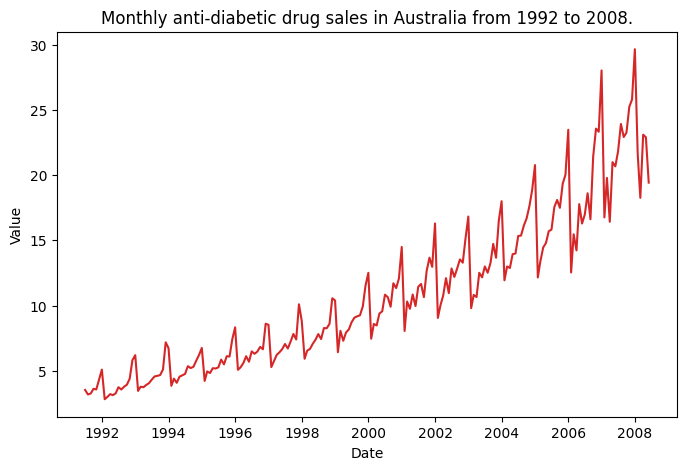

In [ ]:
# Time series data source: fpp pacakge in R.
import matplotlib.pyplot as plt
df = pd.read_csv('https://raw.githubusercontent.com/selva86/datasets/master/a10.csv', parse_dates=['date'], index_col='date')

# Draw Plot
def plot_df(df, x, y, title="", xlabel='Date', ylabel='Value', dpi=100):
    plt.figure(figsize=(8,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()

plot_df(df, x=df.index, y=df.value, title='Monthly anti-diabetic drug sales in Australia from 1992 to 2008.')

## Seasonal plots
You might choose to compare years by plotting by month..

Text(0.5, 1.0, 'Seasonal Plot of Drug Sales Time Series')

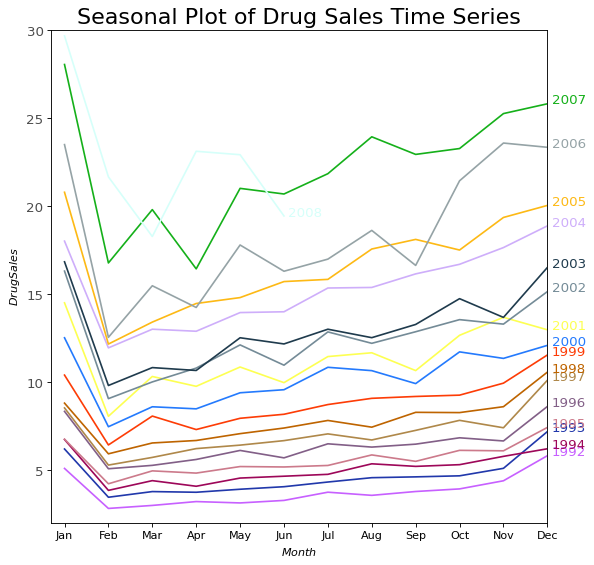

In [ ]:
# Import Data
df = pd.read_csv('https://raw.githubusercontent.com/selva86/datasets/master/a10.csv', parse_dates=['date'], index_col='date')
df.reset_index(inplace=True)

# Prepare data
df['year'] = [d.year for d in df.date]
df['month'] = [d.strftime('%b') for d in df.date]
years = df['year'].unique()

# Prep Colors
np.random.seed(100)
mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(years), replace=False)

# Draw Plot
plt.figure(figsize=(8,8), dpi= 80)
for i, y in enumerate(years):
    if i > 0:
        plt.plot('month', 'value', data=df.loc[df.year==y, :], color=mycolors[i], label=y)
        plt.text(df.loc[df.year==y, :].shape[0]-.9, df.loc[df.year==y, 'value'][-1:].values[0], y, fontsize=12, color=mycolors[i])

# Decoration
plt.gca().set(xlim=(-0.3, 11), ylim=(2, 30), ylabel='$Drug Sales$', xlabel='$Month$')
plt.yticks(fontsize=12, alpha=.7)
plt.title("Seasonal Plot of Drug Sales Time Series", fontsize=20)

Any time series may be split into the following components: Base Level + Trend + Seasonality + Error

A trend is observed when there is an increasing or decreasing slope observed in the time series. Whereas seasonality is observed when there is a distinct repeated pattern observed between regular intervals due to seasonal factors. It could be because of the month of the year, the day of the month, weekdays or even time of the day.

However, It is not mandatory that all time series must have a trend and/or seasonality. A time series may not have a distinct trend but have a seasonality. The opposite can also be true.

So, a time series may be imagined as a combination of the trend, seasonality and the error terms.

<Axes: title={'center': 'Trend and Seasonality'}, xlabel='date'>

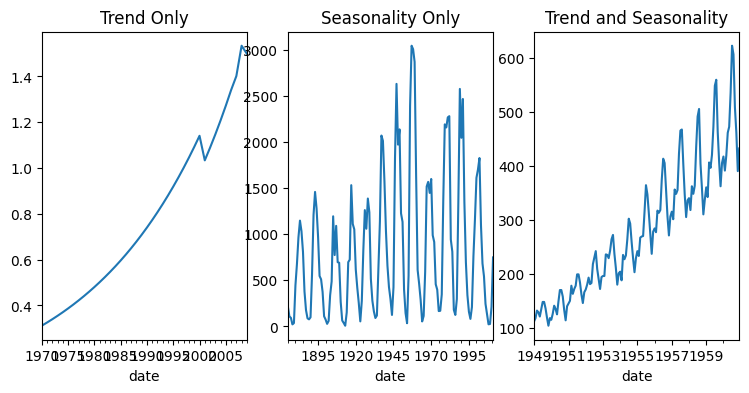

In [ ]:
fig, axes = plt.subplots(1,3, figsize=(9,4), dpi=100)
pd.read_csv('https://raw.githubusercontent.com/selva86/datasets/master/guinearice.csv', parse_dates=['date'], index_col='date').plot(title='Trend Only', legend=False, ax=axes[0])

pd.read_csv('https://raw.githubusercontent.com/selva86/datasets/master/sunspotarea.csv', parse_dates=['date'], index_col='date').plot(title='Seasonality Only', legend=False, ax=axes[1])

pd.read_csv('https://raw.githubusercontent.com/selva86/datasets/master/AirPassengers.csv', parse_dates=['date'], index_col='date').plot(title='Trend and Seasonality', legend=False, ax=axes[2])

# Recurrent Neural Networks

## Generate data

In [ ]:
def gen_func(y_t, y_t2):
    e = np.random.normal(scale=0.01)
    return (0.8 - 0.5 * np.exp(-y_t**2)) * y_t + 0.1*np.sin(np.pi*y_t) \
        - (0.3 + 0.9 * np.exp(-y_t**2)) * y_t2 + e

def generate_data(n=100):
    y_t = 0.1
    y_t2 = 0.1
    data = []
    for i in range(n):
        y_new = gen_func(y_t, y_t2)
        data.append([i, y_new, y_t, y_t2])
        y_t2 = y_t
        y_t = y_new
    return np.array(data)

In [ ]:
data = generate_data(n=1000)

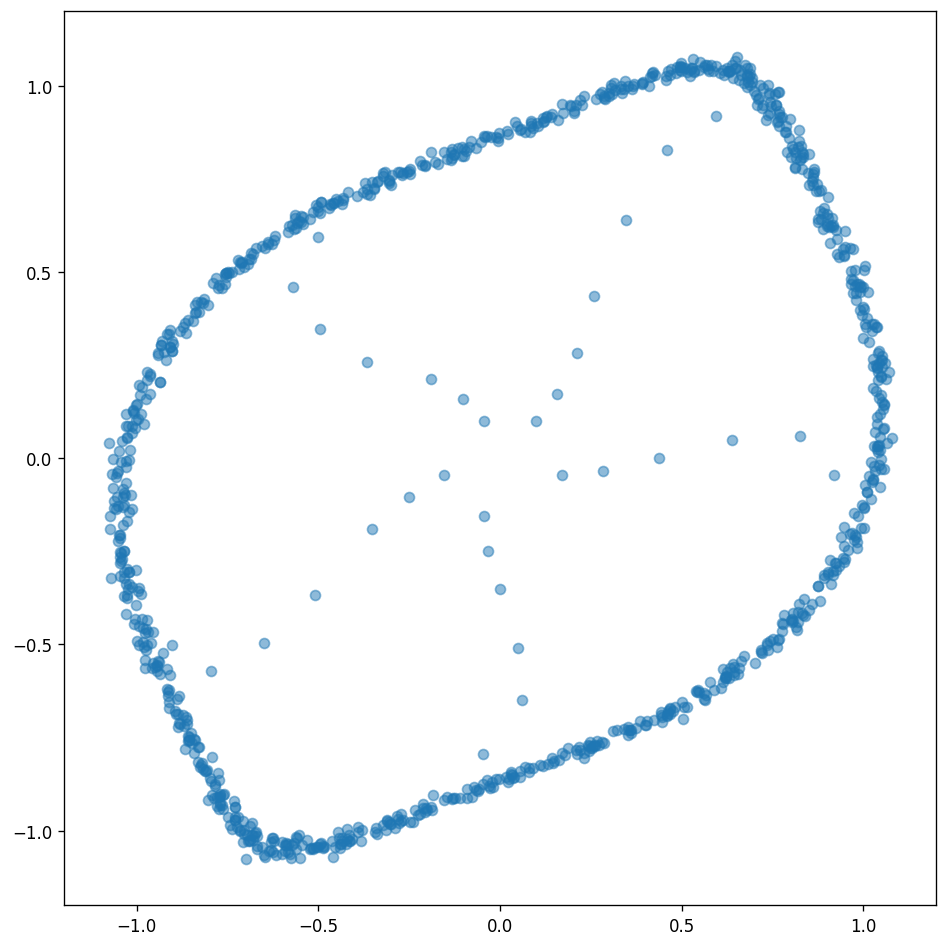

In [ ]:
plt.figure(figsize=(8,8))
ax = plt.subplot(111)
plt.xlim((-1.2,1.2))
plt.ylim((-1.2,1.2))
plt.scatter(data[:,2], data[:,3], alpha=0.5)
plt.tight_layout()
plt.show()

## A sequence model

In [ ]:
max_length=10

def create_model(input_dim, latent_dim, output_dim, num_layers):

    class Net(nn.Module):
        def __init__(self):
            super(Net, self).__init__()
            self.input_dim  = input_dim
            self.hidden_dim = latent_dim
            self.num_layers = num_layers
            self.rnn1   = nn.LSTM(input_dim, latent_dim, num_layers, batch_first = False)
            self.linear = nn.Linear(latent_dim, output_dim)

        def init_hidden(self, batch_size):
          # This is what we'll initialise our hidden state as
          return (torch.zeros(self.num_layers, batch_size, self.hidden_dim),
                  torch.zeros(self.num_layers, batch_size, self.hidden_dim))

        def forward(self, x): #, x_lengths
          batch_size = x.size(1)
          #x = torch.nn.utils.rnn.pack_padded_sequence(x, x_lengths)

          h    = self.init_hidden(batch_size)
          y, h = self.rnn1(x,h)

         # y, _ = torch.nn.utils.rnn.pad_packed_sequence(y)

          y = self.linear(y)

          return y, h


    model = Net()

    return model




def train_model_on_sequences(model, X, y, epochs, verbose=True):

    # pad sequences ``pad_sequence`` stacks a list of Tensors along a new dimension,
    # and pads them to equal length. For example, if the input is list of
    # sequences with size ``L x *`` and if batch_first is False, returns ``T x B x *``,
    # where `T` is length of the longest sequence, `B` is batch size..
    X_padded = nn.utils.rnn.pad_sequence(X)
    y_padded = nn.utils.rnn.pad_sequence(y)


    #####################
    # Train model
    #####################

    hist = np.zeros(epochs)
    criterion = nn.MSELoss()
    optimiser = optim.Adam(model.parameters(), lr=0.001)
    #optimiser = optim.RMSprop(model.parameters(), lr=0.001)
    for t in range(epochs):
        # Clear stored gradient
        model.zero_grad()

        # Initialise hidden state
        # Don't do this if you want your LSTM to be stateful
        #h = model.init_hidden(100)

        # Forward pass
        #X_lengths = (torch.ones(y_padded.size()[1], dtype=torch.int32)*y_padded.size()[0]).cpu()

        y_pred, h = model(X_padded) #, X_lengths)

        loss = criterion(y_pred, y_padded)
        if t % 100 == 0:
            print("Epoch ", t, "MSE: ", loss.item())
        hist[t] = loss.item()

        # Zero out gradient, else they will accumulate between epochs
        optimiser.zero_grad()

        # Backward pass
        loss.backward()

        # Update parameters
        optimiser.step()
    print('Done.')



def predict_sequence(model, initial_frames, num_steps):

        model.eval()
        n, m = initial_frames.shape

        preds = [frame for frame in initial_frames]
        last_frames = initial_frames

        # In each prediction step, we feed in the *whole* (predicted) sequence so far,
        # which fits to the stateful=False setup of our LSTM layer (see above).
        with torch.no_grad():
         for step in range(num_steps):

              # current number of frames (incl past predictions):
              n_frames = len(last_frames)
              d = last_frames.reshape(1, n_frames, m)
              d = torch.from_numpy(d).float()

              # pad the input sequence to match the model's expected length:
              d_padded = nn.utils.rnn.pad_sequence([d.squeeze(dim=0).squeeze(dim=0)])

              #X_lengths = (torch.ones(d_padded.size()[1], dtype=torch.int32)*d_padded.size()[0]).cpu()
              # predict and store:
              pred,h = model(d_padded)#,X_lengths)

              this_pred = pred[-1,0,:].detach().numpy()
              preds.append(this_pred)
              # add the new prediction to the history/sequence:
              last_frames = np.vstack((last_frames, this_pred))

        preds = np.array(preds)
        model.hidden = model.init_hidden(1)
        return preds.reshape(preds.shape[0], -1)

## Helper functions for generating random subsequences for training

In [ ]:
def get_random_subsequence(data, device, seq_length):
    n, m = data.shape
    index = np.random.randint(0, n-seq_length)
    seq = torch.from_numpy(data[index:index+seq_length].reshape(seq_length, -1)).float().to(device)
    return seq

def generate_random_training_sequence(data, device, seq_length):
    frames = get_random_subsequence(data, device, seq_length)
    input_frames = frames[:-1]
    next_frames = frames[1:]
    X = input_frames
    y = next_frames
    return X, y

def generate_random_training_sequences(data, device, n, seq_length):
    X_all = []
    y_all = []
    for i in range(n):
        X, y = generate_random_training_sequence(data, device, seq_length)
        X_all.append(X)
        y_all.append(y)
    return X_all, y_all

## Create the model
you can experiment with the impact of changing `latent_dim`

In [ ]:
# Note: num_layers is the number of recurrent layers.
# E.g., setting num_layers=2 would mean stacking two RNNs together to form a stacked RNN, with the second RNN taking in outputs of the first RNN and computing the final results. Default: 1

model = create_model(input_dim=1, latent_dim=4, output_dim=1, num_layers=1)
model = model.to(device)
print(model)

Net(
  (rnn1): LSTM(1, 4)
  (linear): Linear(in_features=4, out_features=1, bias=True)
)


## Train the model

For longer training, re-run this cell multiple times, or increase the number of epochs.

In [ ]:
X_list, y_list = generate_random_training_sequences(
    data[:,1:2], device, n=100, seq_length=10)

train_model_on_sequences(model, X_list, y_list, epochs=10000)

Epoch  0 MSE:  0.6358850598335266
Epoch  100 MSE:  0.4954957365989685
Epoch  200 MSE:  0.4469910264015198
Epoch  300 MSE:  0.3707886338233948
Epoch  400 MSE:  0.2805875539779663
Epoch  500 MSE:  0.17480383813381195
Epoch  600 MSE:  0.11745579540729523
Epoch  700 MSE:  0.08788145333528519
Epoch  800 MSE:  0.07129418104887009
Epoch  900 MSE:  0.06302467733621597
Epoch  1000 MSE:  0.05931944027543068
Epoch  1100 MSE:  0.057371873408555984
Epoch  1200 MSE:  0.05596888065338135
Epoch  1300 MSE:  0.054816581308841705
Epoch  1400 MSE:  0.0538414865732193
Epoch  1500 MSE:  0.05301095172762871
Epoch  1600 MSE:  0.052299972623586655
Epoch  1700 MSE:  0.05168463662266731
Epoch  1800 MSE:  0.05114194378256798
Epoch  1900 MSE:  0.05065160244703293
Epoch  2000 MSE:  0.050197798758745193
Epoch  2100 MSE:  0.049770183861255646
Epoch  2200 MSE:  0.049363873898983
Epoch  2300 MSE:  0.0489787794649601
Epoch  2400 MSE:  0.04861808940768242
Epoch  2500 MSE:  0.048286132514476776
Epoch  2600 MSE:  0.0479862

### Predict and plot as timeseries
try changing the parameters `window` and `frame_start`

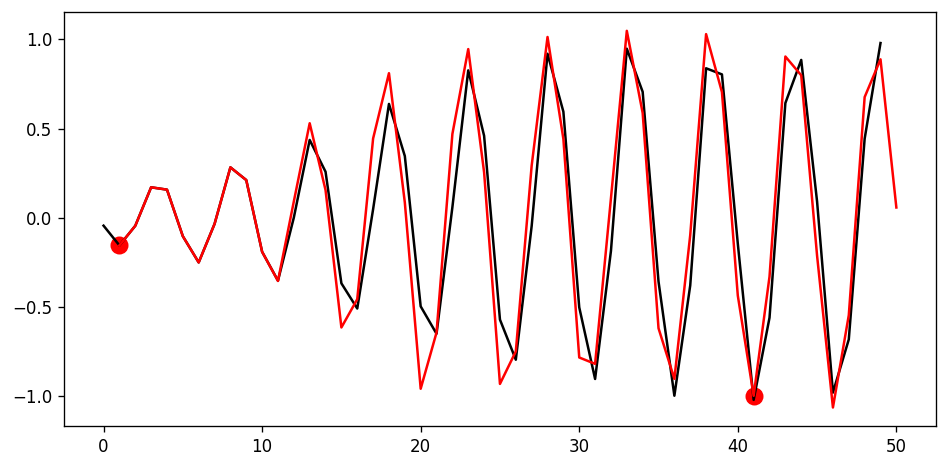

In [ ]:
frames = data[:,1].reshape(-1,1)

frame_start = 1
num_preds = 40
window = 10

preds = predict_sequence(
    model,
    initial_frames=frames[frame_start:frame_start+window],
    num_steps=num_preds)
preds = preds.T[0]

n=50
plt.figure(figsize=(8,4))
ax = plt.subplot(111)
plt.plot(data[:n,0], data[:n,1], c='k')
plt.plot(data[frame_start:frame_start+num_preds+window,0], preds, c='r')
plt.scatter(data[frame_start,0], preds[0], s=96, c='r')
plt.scatter(data[frame_start+num_preds,0], preds[num_preds], s=96, c='r')
plt.tight_layout()
plt.show()

Black is the actual sequence, red is the predicted one.

### Predict and plot as phase portrait

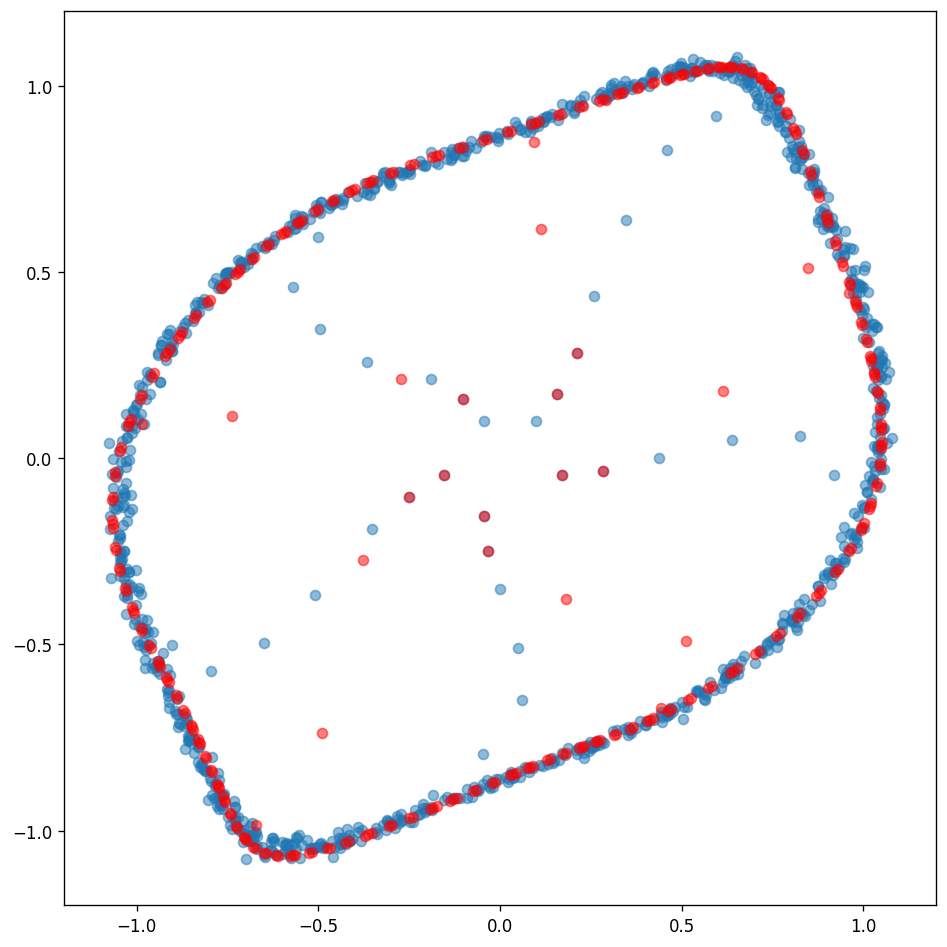

In [ ]:
frames = data[:,1].reshape(-1,1)

frame_start = 0
num_preds = 300

preds = predict_sequence(
    model,
    initial_frames=frames[frame_start:frame_start+window],
    num_steps=num_preds)
preds = preds.T[0]


plt.figure(figsize=(8,8))
ax = plt.subplot(111)
plt.xlim((-1.2,1.2))
plt.ylim((-1.2,1.2))
plt.scatter(data[:,2], data[:,3], alpha=0.5)
plt.scatter(preds[1:], preds[:-1], alpha=0.5, c='r')
plt.tight_layout()
plt.show()

### Plot again - now as lines

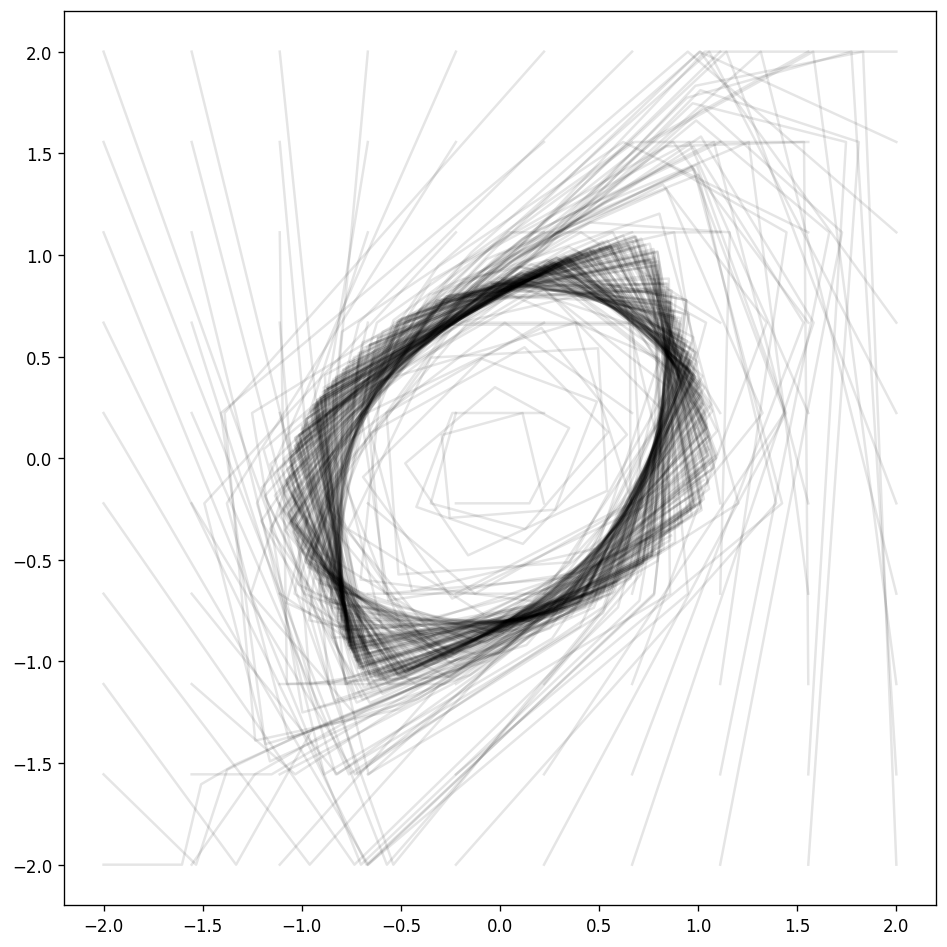

In [ ]:
grid_x = np.linspace(-2, 2, 10)
grid_y = np.linspace(-2, 2, 10)
xx, yy = np.meshgrid(grid_x, grid_y)

num_preds = 10

plt.figure(figsize=(8,8))
ax = plt.subplot(111)
preds = None
for i in range(len(grid_x)):
    for j in range(len(grid_y)):
        t2 = yy[i,j]
        t1 = xx[i,j]
        seq = np.array([t2, t1]).reshape(2, 1)
        preds = predict_sequence(model,
                                 initial_frames=seq,
                                 num_steps=num_preds)
        preds = preds.T[0]
        plt.plot(preds[1:], preds[:-1], alpha=0.1, c='k')

#plt.scatter(data[:,2], data[:,3], alpha=0.5)
plt.tight_layout()
plt.show()

## Other time-series data
Now that you have your model running on one problem, can you adapt it to another? Take e.g. the sunspots or the anti-diabetic drug historical data from above and build an LSTM model. Compare it to trying to predict with static network, based on delayed inputs.

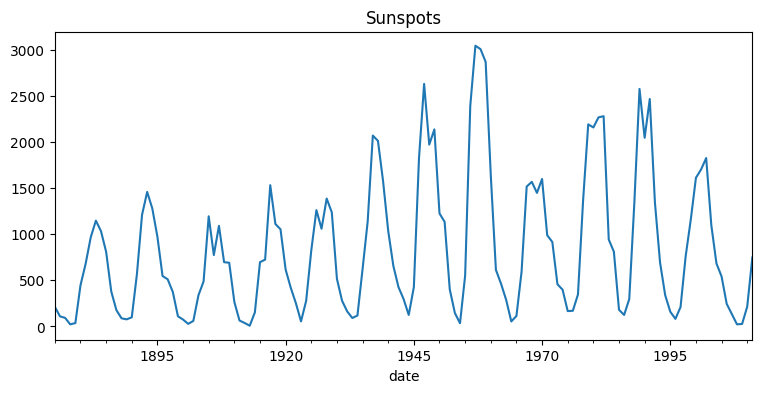

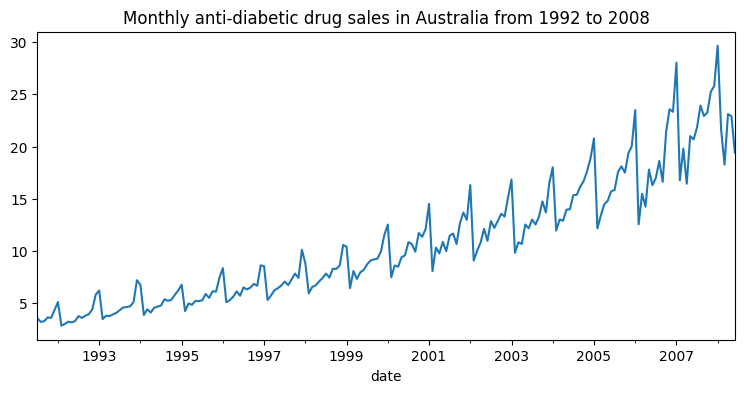

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1,1, figsize=(9,4), dpi=100)
sunspots_frame = pd.read_csv('https://raw.githubusercontent.com/selva86/datasets/master/sunspotarea.csv', parse_dates=['date'], index_col='date')
diabetic_frame = pd.read_csv('https://raw.githubusercontent.com/selva86/datasets/master/a10.csv', parse_dates=['date'], index_col='date')
sunspots_frame.plot(title='Sunspots', legend=False, ax=axes)
sunspots_index = sunspots_frame.index
sunspots = sunspots_frame.to_numpy()

fig, axes = plt.subplots(1,1, figsize=(9,4), dpi=100)
diabetic_frame.plot(title='Monthly anti-diabetic drug sales in Australia from 1992 to 2008', legend=False, ax=axes)
diabetic_index = diabetic_frame.index
diabetic = diabetic_frame.to_numpy()

# Deep Learning Lab 6: Autoencoders

In this lab we will experiment with Autoencoders for learning latent space of the MNIST images.
- We will experiment with vanilla AE, convolutional AE, denoising AE and Variational AE. You are encouraged to also experiment with some of the other variants discussed in class.
- You can apply this notebook to another dataset, eg, fashionMNIST is a straightforward replacement. Larger datasets may require more training epochs, and/or larger architectures to show results.
- We will only train the models for 10 epochs for speed, but it is very clear that better performance would be achieved with longer training!
- similarly, we only use 2 latent dimensions for visualisation - more would probably improve performance.

## Preliminaries
As usual we will start with some imports

In [ ]:
#@title
from google.colab import files

# Common imports
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize']  = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "Lab6"

# make sure you use the GPU (btw check your runtime is a GPU in colab)
use_cuda = True
device = torch.device("cuda" if (use_cuda and torch.cuda.is_available()) else "cpu")
print('Pytorch is using ' + str(device))

def save_fig(fig_id, tight_layout=True):
    try:
      os.mkdir(os.path.join(PROJECT_ROOT_DIR, "images"))
      os.mkdir(os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID))
    except OSError:
      pass

    path = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID, fig_id + ".png")
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format='png', dpi=300)
    files.download(PROJECT_ROOT_DIR+'/images/'+CHAPTER_ID+'/'+fig_id + ".png")


Pytorch is using cuda


## Dataset

We will use the MNIST dataset for simplicity and speed in this lab, but you could use another, for example FashionMNIST, or CIFAR10.

**Note 1:** *Make sure that the input dimensions and that the fully connected dimensions work for your dataset though.*

**Note 2:** *Larger datasets may take more time, and require more latent dimensions/channels in hidden layers to perform well.*

In [ ]:
# Use standard MNIST dataset
train_set = torchvision.datasets.MNIST(
    root = './data/MNIST',
    download = True,
    train=True,
    transform = transforms.Compose([
        transforms.ToTensor()
    ])
)

test_set = torchvision.datasets.MNIST(
    root = './data/MNIST',
    download = True,
    train=False,
    transform = transforms.Compose([
        transforms.ToTensor()
    ])
)

print(train_set, test_set)

# set up a loader object to use minibatches (we set minibatch size to 32, you could easily push that up)
train_loader = torch.utils.data.DataLoader(train_set, batch_size = 32)

# also set up a loader for test data, using a single batch
test_loader = torch.utils.data.DataLoader(test_set)


100%|██████████| 9912422/9912422 [00:00<00:00, 118947135.57it/s]


Extracting ./data/MNIST/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 92682244.70it/s]


Extracting ./data/MNIST/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 49909369.31it/s]

Extracting ./data/MNIST/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 968999.43it/s]


Extracting ./data/MNIST/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/MNIST/raw

Dataset MNIST
    Number of datapoints: 60000
    Root location: ./data/MNIST
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
           ) Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data/MNIST
    Split: Test
    StandardTransform
Transform: Compose(
               ToTensor()
           )


## Utility functions

We'll start by defining some utility functions for training and testing our models. This is similar to what we've done before, but note that we now have a pair of networks: the encoder and the decoder.

### Training function

In [ ]:
### Training function
def train_epoch(autoencoder, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    autoencoder.train()
    train_loss = []

    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)

        # encode+decode data0
        decoded_data = autoencoder(image_batch)

        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # record the loss
        train_loss.append(loss.detach().cpu().numpy())

    # we return the average loss over this epoch
    return np.mean(train_loss)

### Test function

In [ ]:
### Testing function
def test_epoch(autoencoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    autoencoder.eval()
    val_loss = []
    with torch.no_grad(): # No need to track the gradients
        for image_batch, _ in dataloader:

            # Move tensor to the proper device
            image_batch = image_batch.to(device)

            # Encode + Decode data
            decoded_data = autoencoder(image_batch)

            # calculate the loss/error
            val_loss.append(loss_fn(decoded_data, image_batch).detach().cpu().numpy())

    # we return the average loss over this epoch
    return np.mean(val_loss)

### Visualisation function

In [ ]:
### visualisation function to compare reconstruction to training images.
def plot_ae_outputs(autoencoder,test_dataset,n=10):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}

    for i in range(n):
      # get the image
      img = test_dataset[t_idx[i]][0].unsqueeze(0).to(device)
      autoencoder.eval()

      # create the reconstruction for this image
      with torch.no_grad():
         rec_img  = autoencoder(img)

      # plot the original images in the first row
      ax = plt.subplot(2,n,i+1)
      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
      if i == n//2:
        ax.set_title('Original images')

      # plot the reconstruction of the images in the second row
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
      if i == n//2:
         ax.set_title('Reconstructed images')

    plt.show()

The following function will show the latent space (only really works for 2-dimensional embedding space)

In [ ]:
### visualisation function for the embedding space
# only works for embedding spaces of 2 dimensions
# you may be able to extend it to larger embedding spaces
# by adding a PCA/t-sne
def plot_embedding_space(autoencoder, n=5):
  plt.figure(figsize=(16,16))

  # create a 2D grid of latent vectors
  vals = np.linspace(-1,+1,n)
  z1vals,z2vals = np.meshgrid(vals,vals)
  zvals = np.array([z1vals.flatten(),z2vals.flatten()]).T
  z = torch.tensor(zvals).to(device, dtype=torch.float32)

  # reconstruct the images
  autoencoder.eval()
  with torch.no_grad():
    x_hat = autoencoder.decoder(z)
  imgs = x_hat.cpu().squeeze().numpy()

  # and plot
  for i in range(n):
    for j in range(n):
      ax = plt.subplot(n,n,i*n+j+1)
      plt.imshow(imgs[i*n+j, ...], cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

## Dense AutoEncoder

As a first attempt, we will build a simple autoencoder based on fully connected layers.
Note that in contrast to previous networks, we need to build two parts: the encoder and the decoder. We could also group them in a single autoencoder class.


### Model

We start by defining the encoder. This is a straightforward fully-connected neural network. Note that we need to start with `Flatten()` on our images.

In [ ]:
class EncoderDense(nn.Module):

    def __init__(self, latent_dims, hidden_dims=128):
        super().__init__()

        # we define the encoder as two layers with ReLU activation.
        self.encoder = nn.Sequential(
            nn.Flatten(start_dim=1),
            nn.Linear(28*28, hidden_dims),
            nn.ReLU(True),
            nn.Linear(hidden_dims, latent_dims)
        )

    def forward(self, x):
        x = self.encoder(x)
        return x



We then create the decoder, another fully connected neural network that takes as input the latent space, and as output the image size (we will need to use `unflatten()` for this). Any architecture will do, but often we use an architecture mirroring the encoder.

In [ ]:
class DecoderDense(nn.Module):

    def __init__(self, latent_dims, hidden_dims=128):
        super().__init__()

        # the decoder needs to follow the same structure as the encoder.
        self.decoder = nn.Sequential(
            nn.Linear(latent_dims, hidden_dims),
            nn.ReLU(True),
            nn.Linear(hidden_dims, 28 * 28),
            nn.Unflatten(dim=1, unflattened_size=(1, 28, 28)),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.decoder(x)
        return x

Finally, we create a new `AutoEncoder` class that will run the encoder then the decoder on inputs. We do not always need to do this, but it will simplify the training.

In [ ]:
class AutoEncoder(nn.Module):
  def __init__(self, encoder, decoder):
    super().__init__()

    self.encoder = encoder
    self.decoder = decoder

  def forward(self,x):
    return self.decoder(self.encoder(x))

### Training
We can then train this autoencoder model for a few epochs on the training data.


 EPOCH 1/10 	 train loss 0.22598488628864288 	 val loss 0.21217507123947144


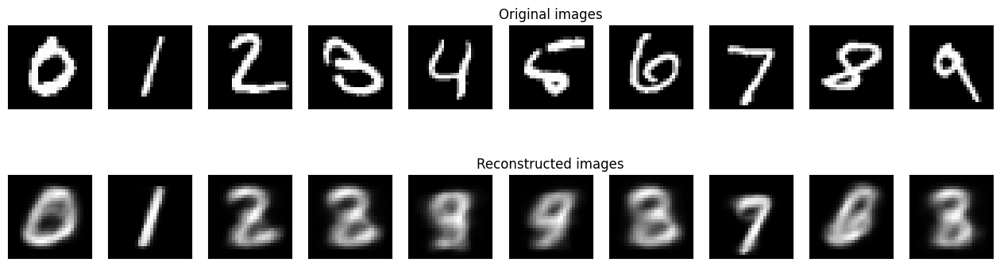


 EPOCH 2/10 	 train loss 0.20514628291130066 	 val loss 0.2027578055858612


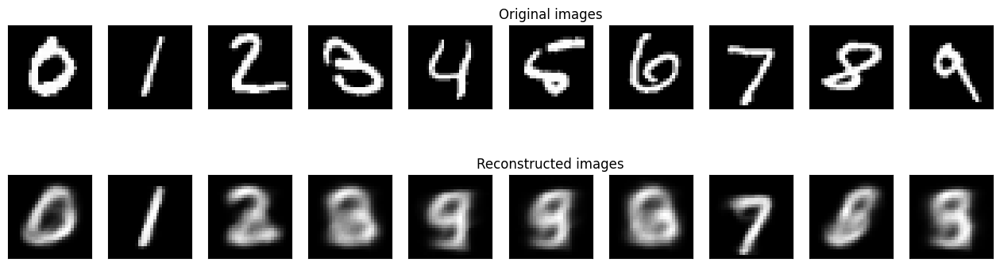


 EPOCH 3/10 	 train loss 0.1996113508939743 	 val loss 0.1988876461982727


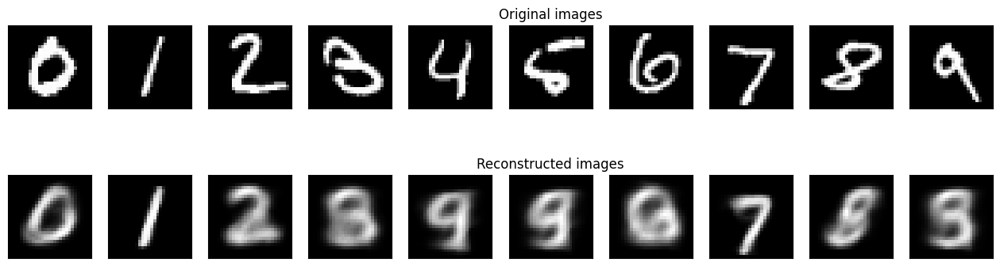


 EPOCH 4/10 	 train loss 0.1963995397090912 	 val loss 0.1967529058456421


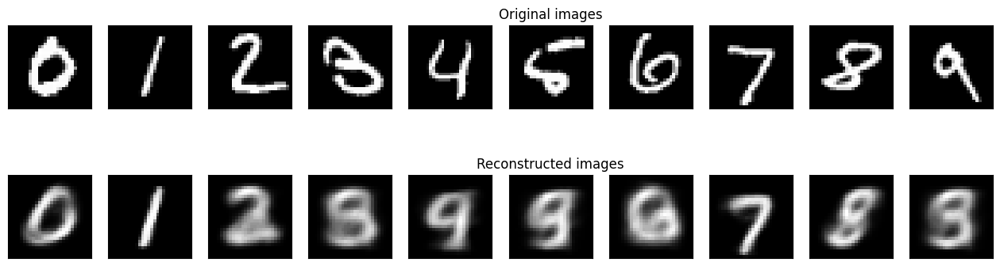


 EPOCH 5/10 	 train loss 0.19426344335079193 	 val loss 0.19531910121440887


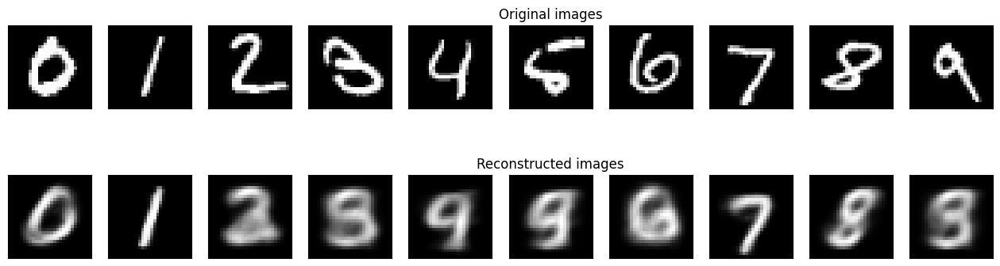


 EPOCH 6/10 	 train loss 0.19267284870147705 	 val loss 0.19345960021018982


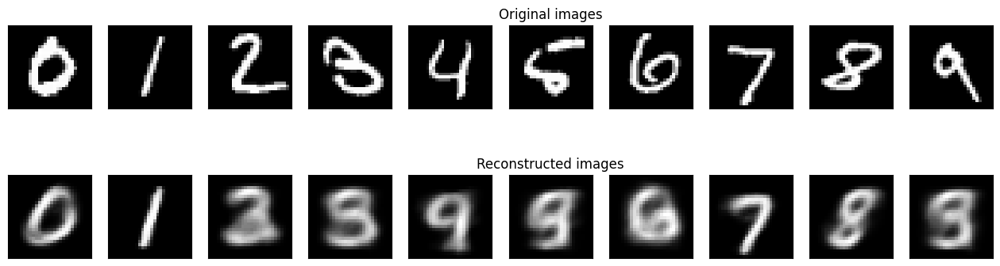


 EPOCH 7/10 	 train loss 0.1913459151983261 	 val loss 0.19230903685092926


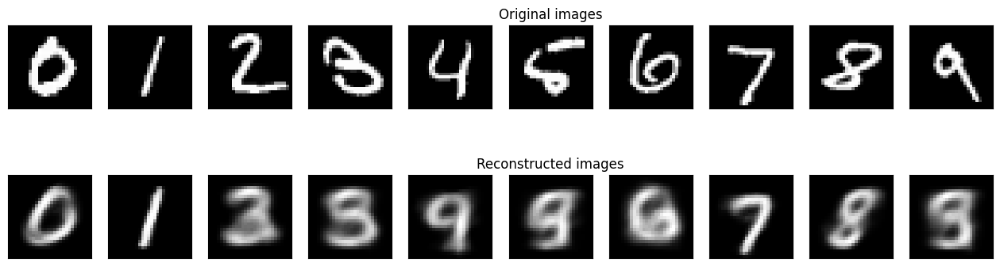


 EPOCH 8/10 	 train loss 0.1902591735124588 	 val loss 0.19212070107460022


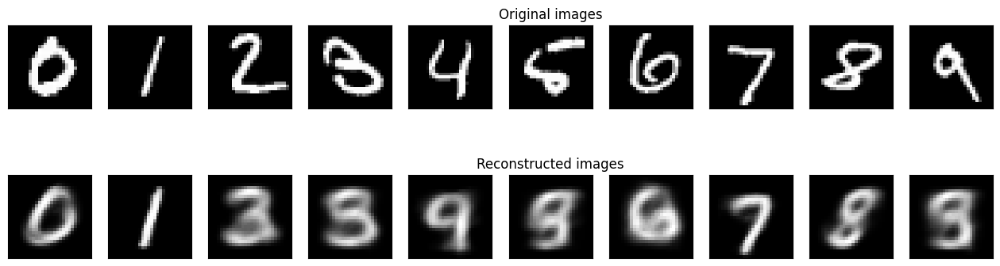


 EPOCH 9/10 	 train loss 0.1893596053123474 	 val loss 0.19124124944210052


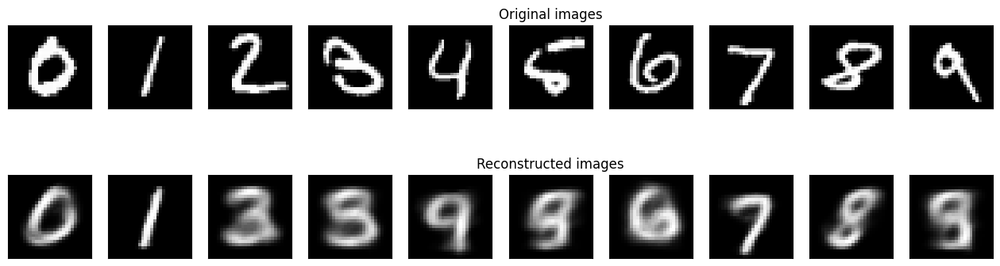


 EPOCH 10/10 	 train loss 0.18863366544246674 	 val loss 0.19109369814395905


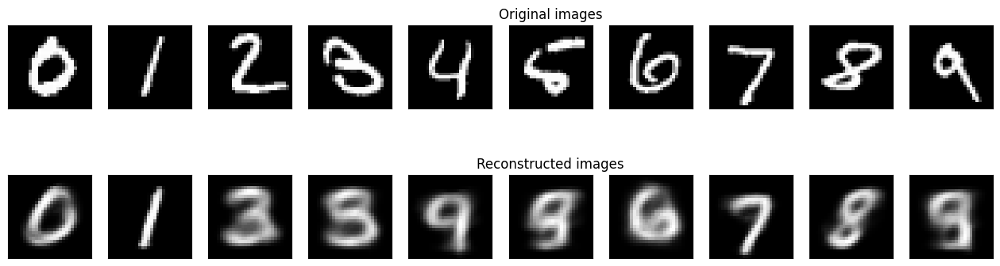

In [ ]:
# set the learning rate
lr = 0.001

# Set the random seed for reproducible results
torch.manual_seed(0)

# set the latent dimension (how big/small is the space in which you want to encode your inputs)
latent_dims = 2

# Initialize the autoencoder
encoder = EncoderDense(latent_dims)
decoder = DecoderDense(latent_dims)
dense_ae = AutoEncoder(encoder, decoder)
params_to_optimize = dense_ae.parameters()
optimizer = optim.Adam(params_to_optimize, lr=lr)

# Move both the encoder and the decoder to the selected device
dense_ae.to(device)

# set the loss function to optimise. As seen in class, it basically depends on
# the data, often MSE will be appropriate as you try to reconstruct the input,
# but in the special case where the input data is 0 or 1 (like for MNIST),
# Cross Entropy can be a better choice
# You should change this if you try CIFAR10!
loss_fn = nn.BCELoss()

num_epochs = 10
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
   train_loss = train_epoch(dense_ae,device,train_loader,loss_fn,optimizer)

   # if you increase the number of epochs drastically, add the usual
   # if statement to only calculate val loss and print only every n epochs.
   # also, if you are using a regularised loss function, you may want to save
   # the validation reconstruction error instead of the loss
   val_loss = test_epoch(dense_ae,device,test_loader,loss_fn)
   print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   diz_loss['train_loss'].append(train_loss)
   diz_loss['val_loss'].append(val_loss)
   plot_ae_outputs(dense_ae,test_set,n=10)

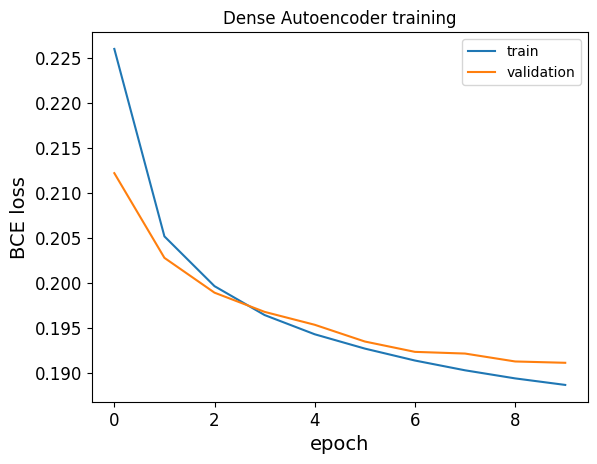

In [ ]:
plt.plot(diz_loss['train_loss'], label='train')
plt.plot(diz_loss['val_loss'], label='validation')
plt.xlabel('epoch')
plt.ylabel('BCE loss')
plt.title('Dense Autoencoder training')
plt.legend()

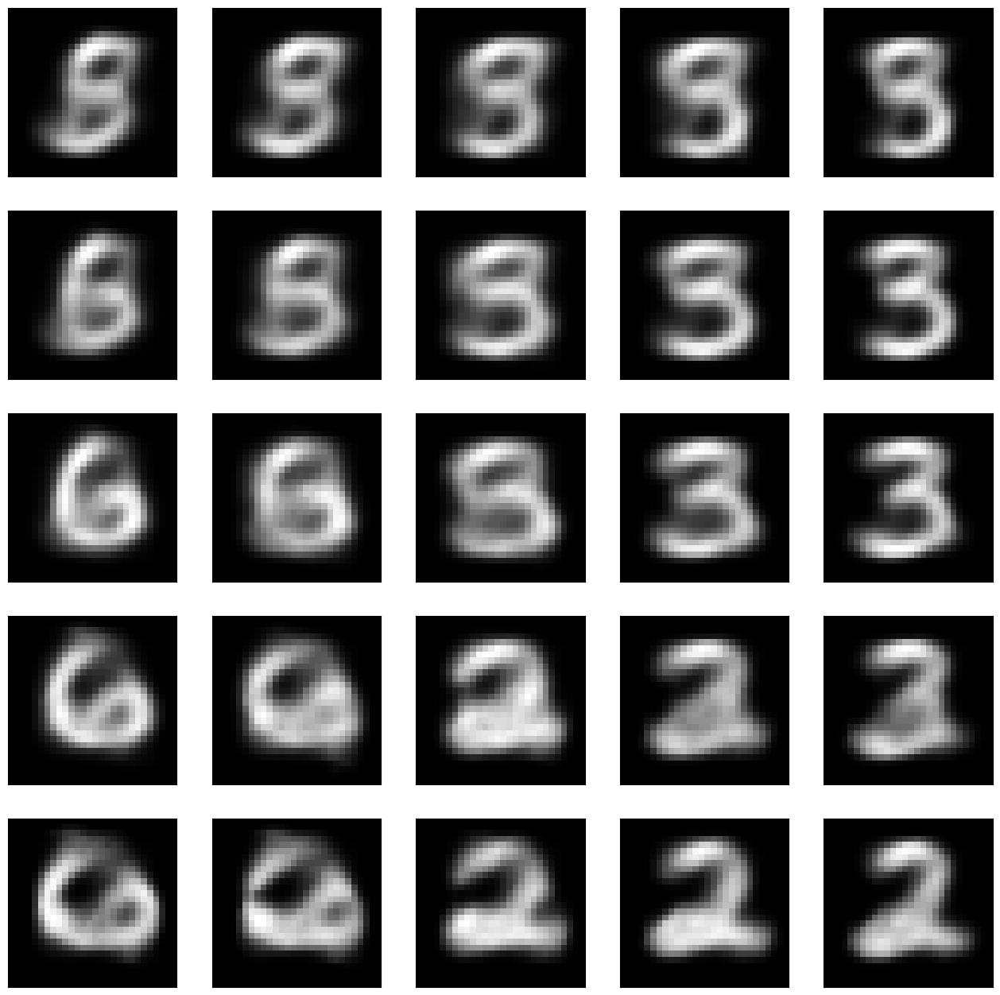

In [ ]:
plot_embedding_space(dense_ae)

What is the result like? What do you observe?

## Convolutional AutoEncoder

We now that convolutional layers are apt at discovering patterns in images, so they should be useful for learning better representations with AEs.
Let's try that by building an autoencoder with convolutional layers.

### Model
This time we define our encoder as a CNN. Note that we could choose to remove the flattening operation and the fully connected part, and keep our latent space as a tensor space rather than a vector space, but we will keep things simpler here.

The architecture here is a simple CNN with an output of the desired dimension `latent_dims`

In [ ]:
class EncoderCNN(nn.Module):
    def __init__(self, latent_dims=2, fc_dims=128, cnn_dims=[32,64,128], imsize=28, imchannels=1):
        super().__init__()

        ### your code here

    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_fc(x)
        return x

We define the decoder in a similar way. We try to mirror the encoder architecture, with a dense part, unflattening, followed by convolutional parts.

In [ ]:
class DecoderCNN(nn.Module):

    def __init__(self, latent_dims=2, fc_dims=128, cnn_dims=[32, 64, 128], imsize=28, imchannels=1):
        super().__init__()

        ### your code here

    def forward(self, x):
        x = self.decoder_fc(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x) # because the output values are between 0 and 1
        return x

torch.Size([2, 1, 28, 28])
torch.Size([2, 2])
torch.Size([2, 1, 28, 28])


### Training


 EPOCH 1/10 	 train loss 0.21961325407028198 	 val loss 0.2077144980430603


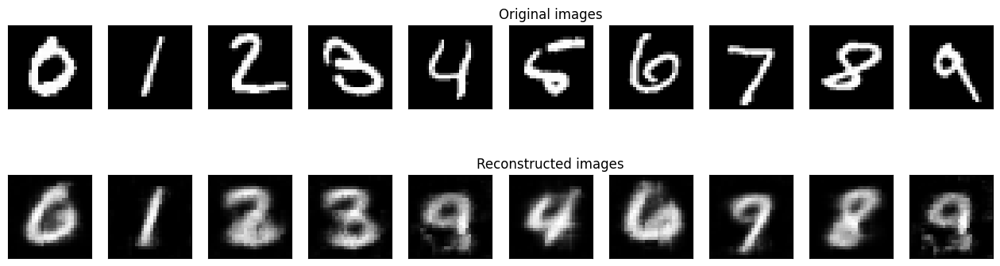


 EPOCH 2/10 	 train loss 0.19738134741783142 	 val loss 0.2020682543516159


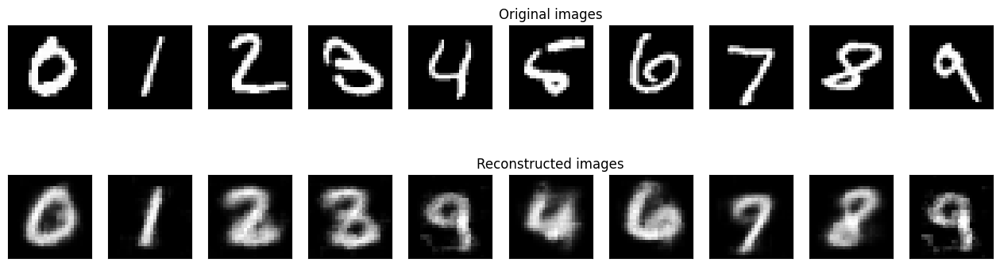


 EPOCH 3/10 	 train loss 0.19358932971954346 	 val loss 0.201287180185318


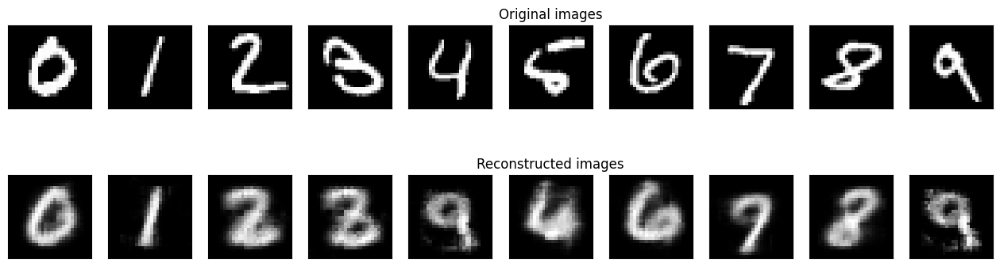


 EPOCH 4/10 	 train loss 0.19123025238513947 	 val loss 0.19769607484340668


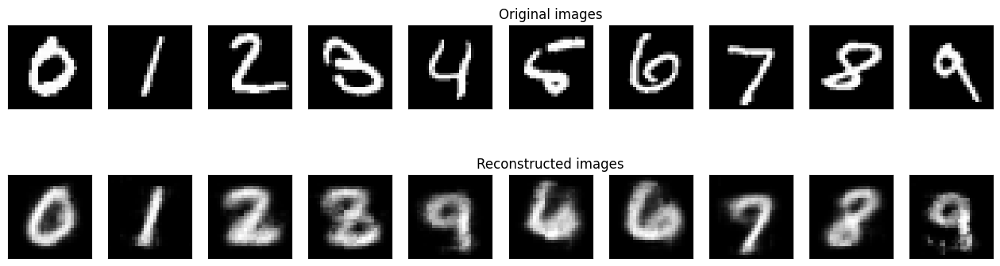


 EPOCH 5/10 	 train loss 0.18948543071746826 	 val loss 0.19825787842273712


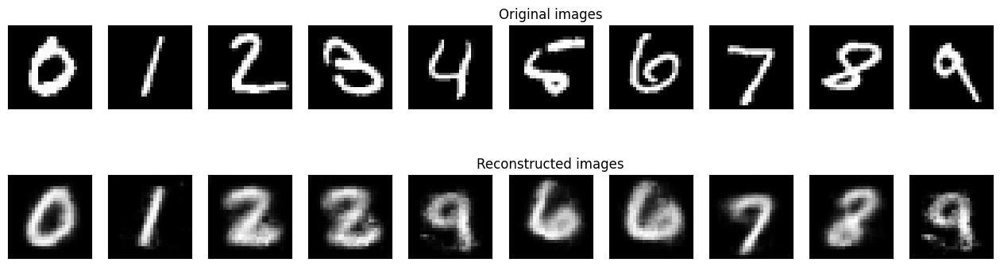


 EPOCH 6/10 	 train loss 0.18825550377368927 	 val loss 0.19960351288318634


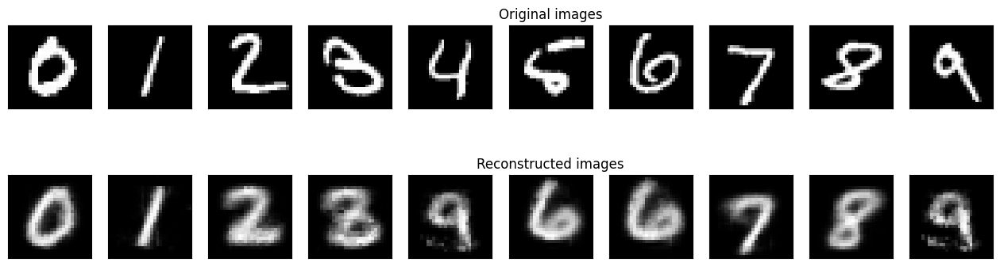


 EPOCH 7/10 	 train loss 0.18707217276096344 	 val loss 0.1949300616979599


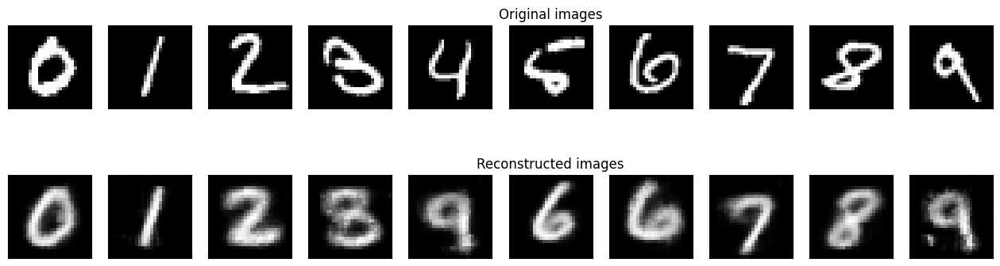


 EPOCH 8/10 	 train loss 0.1861763298511505 	 val loss 0.19519053399562836


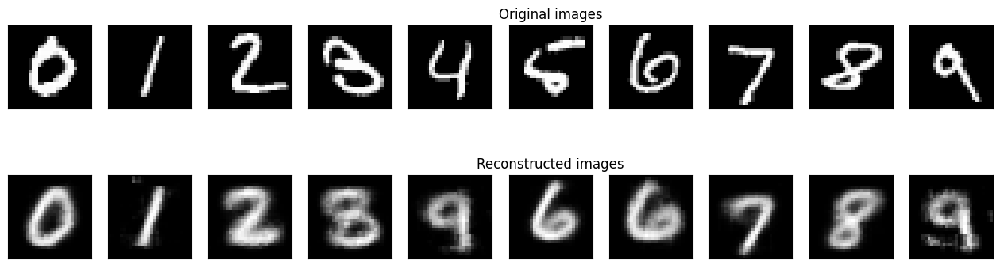


 EPOCH 9/10 	 train loss 0.18561872839927673 	 val loss 0.19520393013954163


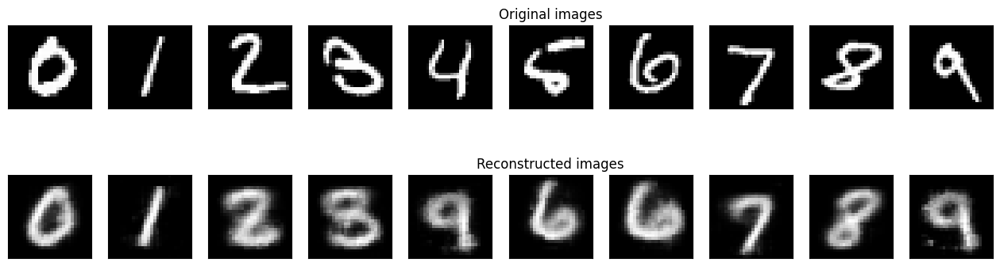


 EPOCH 10/10 	 train loss 0.18493977189064026 	 val loss 0.1935248225927353


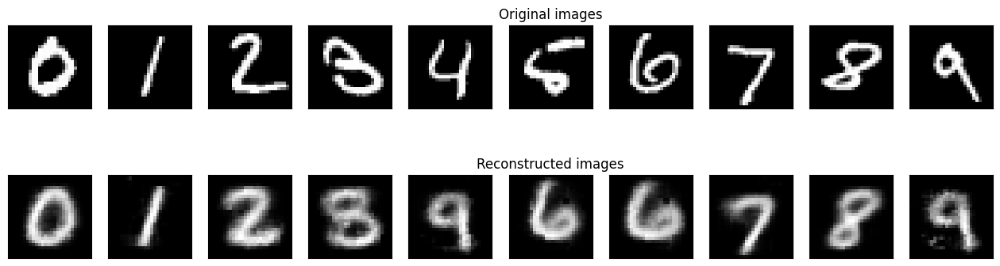

In [ ]:
# set the learning rate
lr = 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)

# set the latent space dimension
latent_dims = 2

### Initialize the two networks
encoder = EncoderCNN(latent_dims=latent_dims)
decoder = DecoderCNN(latent_dims=latent_dims)

# we then create the autoencoder
conv_ae = AutoEncoder(encoder,decoder)

# get the parameters
params_to_optimize = conv_ae.parameters()

# and set the optimiser
optimizer = optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

# Move both the encoder and the decoder to the selected device
conv_ae.to(device)

# set the loss function to optimise. As seen in class, it basically depends on
# the data, often MSE will be appropriate as you try to reconstruct the input,
# but in the special case where the input data is 0 or 1 (like for MNIST),
# Cross Entropy can be a better choice
# You should change this if you try CIFAR10!
loss_fn = nn.BCELoss()

# and the usual training loop
num_epochs = 10
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
   train_loss = train_epoch(conv_ae,device,train_loader,loss_fn,optimizer)

   # if you increase the number of epochs drastically, add the usual
   # if statement to only calculate val loss and print only every n epochs.
   # also, if you are using a regularised loss function, you may want to save
   # the validation reconstruction error instead of the loss
   val_loss = test_epoch(conv_ae,device,test_loader,loss_fn)
   print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   diz_loss['train_loss'].append(train_loss)
   diz_loss['val_loss'].append(val_loss)
   plot_ae_outputs(conv_ae,test_set,n=10)

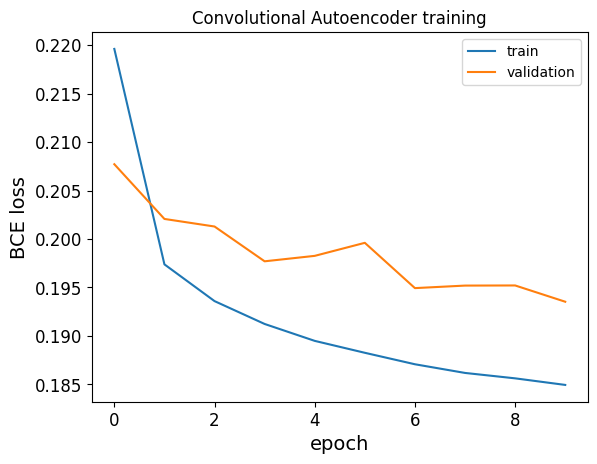

In [ ]:
plt.plot(diz_loss['train_loss'], label='train')
plt.plot(diz_loss['val_loss'], label='validation')
plt.xlabel('epoch')
plt.ylabel('BCE loss')
plt.title('Convolutional Autoencoder training')
plt.legend()

### Visualisation

We can also display the latent space (or at least the two first dimensions) to see how the digits are distributed. Note that the only thing we are optimising for is reconstruction accuracy, so we should not expect the digits to be all separated in this space (assuming this were possible).

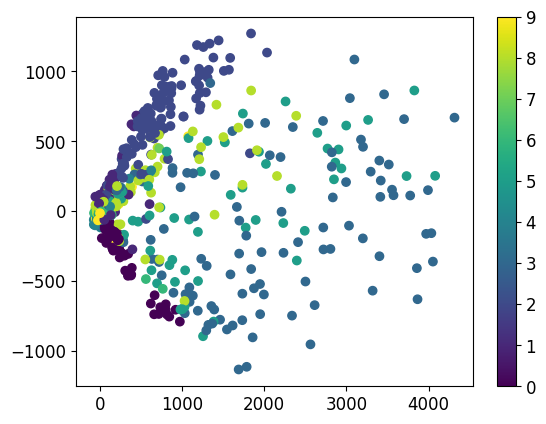

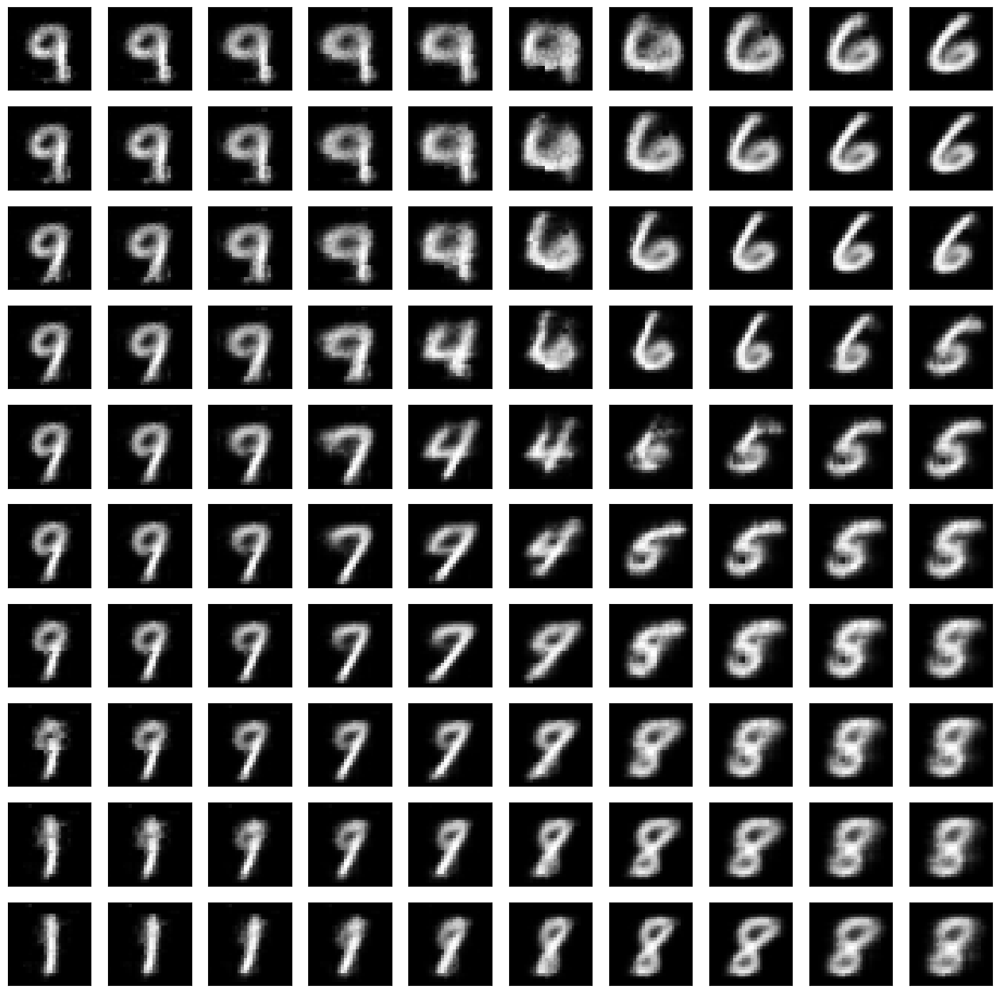

In [ ]:
def show_latent(encoder, data, N=1000):
    encoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []

        # We will plot only the N first examples, for clarity
        # It would be better to random sample the N examples, but that will do.
        images = data.data[:N,:,:]
        labels = data.targets[:N]

        # Move tensor to the proper device
        image_batch = images.float().unsqueeze(1).to(device)

        # Encode data
        encoded_data = encoder(image_batch).cpu()

        # plot the examples over the two first dimensions.
        # will make more sense if you squeeze your latent space all the
        # way to 2 dimensions, but of course that would come at the cost
        # of accuracy. We could also use an additional step such as PCA/t-sne
        # to help the visualisation - in any case, take any such visualisation
        # with a grain of salt!
        plt.scatter( encoded_data[:,0], encoded_data[:,1], c=labels)

        # using a colorbar is a bit unusual for discrete classes, but it will do the job.
        plt.colorbar()

show_latent(conv_ae.encoder, test_set)
plot_embedding_space(conv_ae, 10)


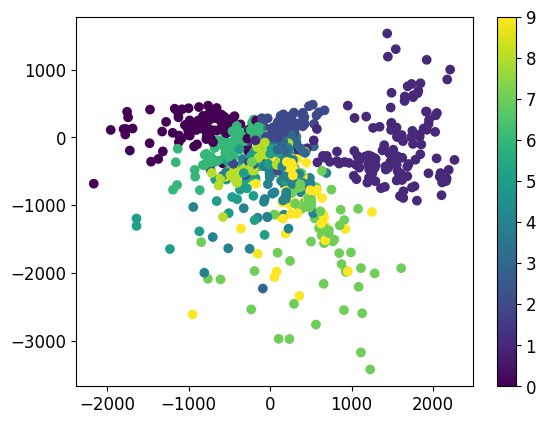

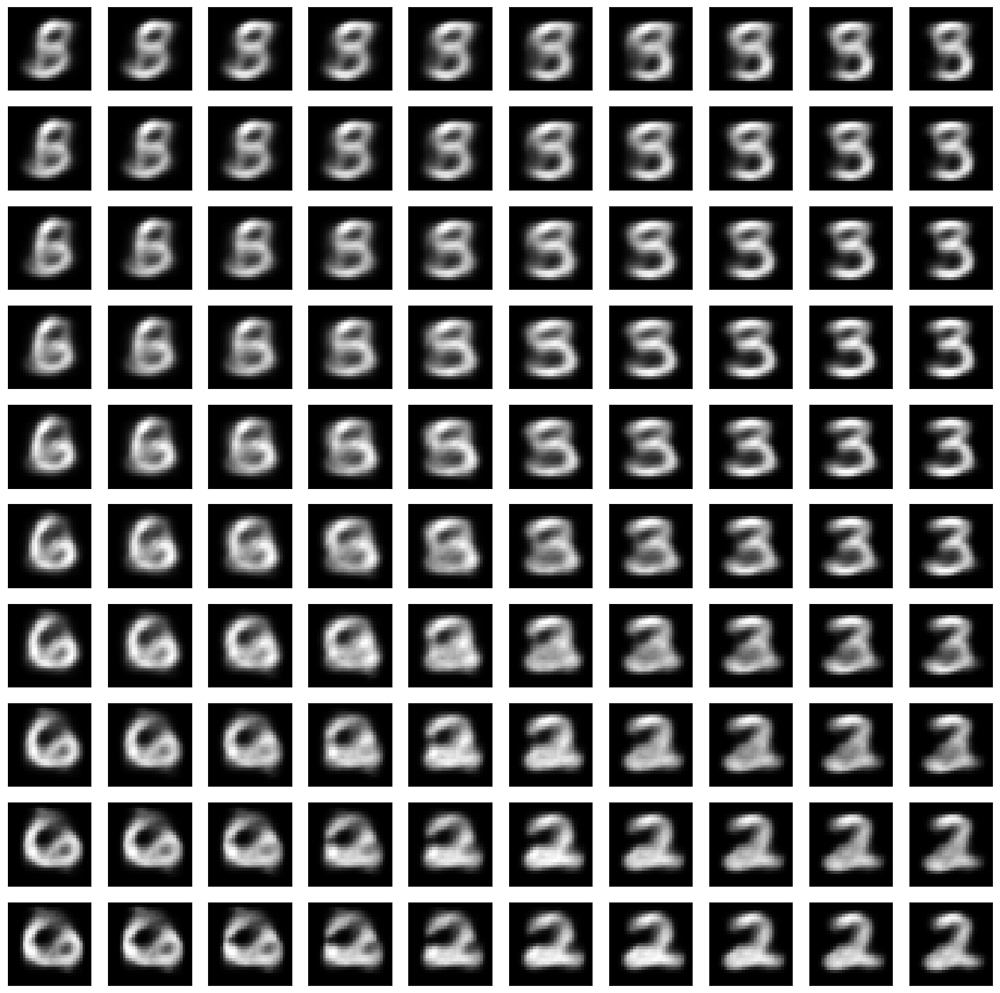

In [ ]:
show_latent(dense_ae.encoder, test_set)
plot_embedding_space(dense_ae, 10)

### Interpolation
We can then try to visualise how smooth is the manifold of digits in the latent space of numbers by interpolating between two numbers.

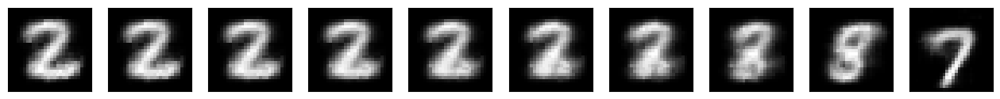

In [ ]:

# get indices of digits 1 to 10
targets = test_set.targets.numpy()
t_idx = {i:np.where(targets==i)[0][0] for i in range(10)}

img_d1 = test_set[t_idx[2]][0].unsqueeze(0).to(device)
lat_d1 = conv_ae.encoder(img_d1)

img_d2 = test_set[t_idx[7]][0].unsqueeze(0).to(device)
lat_d2 = conv_ae.encoder(img_d2)


plt.figure(figsize=(16,4.5))

# draw a linear space between the two latent vectors
for i,z in enumerate(torch.linspace(0,1,10)):
  ax = plt.subplot(1,10,i+1)

  lat = (1-z)*lat_d1 + z*lat_d2
  with torch.no_grad():
    rec = conv_ae.decoder(lat)

    plt.imshow(rec.cpu().squeeze().numpy(), cmap='gist_gray')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    #ax.set_title('Reconstructed images')

plt.show()



This experiment should demonstrate that you can efficiently compress the 28x28 images into a 2-dimensional space with reasonable accuracy (but loosing some precision).

Now retrain the network by increasing the latent dimension, for example to 10. What do you observe? You should see that the interpolation between two digits becomes smoother due to the higher dimensionality of the space.

## Denoising AutoEncoder
Next we will try our hand to a denoising autoencoder. We can reuse the architecture of the autoencoder before, but we will inject noise to the inputs at training time.

The simplest way to do this is to create a new dataloader for the training set that provides both original and corrupted versions of the images.

### Model
We just add noise to the input before encoding (at training time)

In [ ]:
class DenoisingAutoEncoder(nn.Module):
  def __init__(self, latent_dims, noise_type="Gaussian", sigma=1.0):
    super().__init__()
    self.sigma = sigma
    self.encoder = EncoderCNN(latent_dims)
    self.decoder = DecoderCNN(latent_dims)

  def add_noise(self, x, sigma=None):
    if not sigma:
      sigma = self.sigma

    noise = torch.Tensor(np.random.normal(0.0, sigma, x.shape)).to(device)
    return x + noise

  def forward(self, x):
    if self.training:
      x = self.add_noise(x)

    return self.decoder(self.encoder((x)))

### Visualisation function

In [ ]:
### visualisation function to compare reconstruction to training images.
def plot_dae_outputs(dae,test_dataset,n=10):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}

    for i in range(n):
      ax = plt.subplot(3, n, i+1)
      x = test_dataset[t_idx[i]][0].unsqueeze(0).to(device)

      # reconstruct the image
      dae.eval()
      with torch.no_grad():
        x_noise = dae.add_noise(x)
        z  = dae.encoder(x_noise)
        x_hat = dae.decoder(z)


      # show the original image in the first row
      plt.imshow(x.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(3, n, i + 1 + n)

      # show the noisy image in the second row
      plt.imshow(x_noise.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
      if i == n//2:
        ax.set_title('Noisy images')
      ax = plt.subplot(3, n, i + 1 + 2*n)

      # show the reconstructed image in the third row
      plt.imshow(x_hat.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
      if i == n//2:
         ax.set_title('Reconstructed images')

    plt.show()

### Training


 EPOCH 1/10 	 train loss 0.22654804587364197 	 val loss 0.21073313057422638


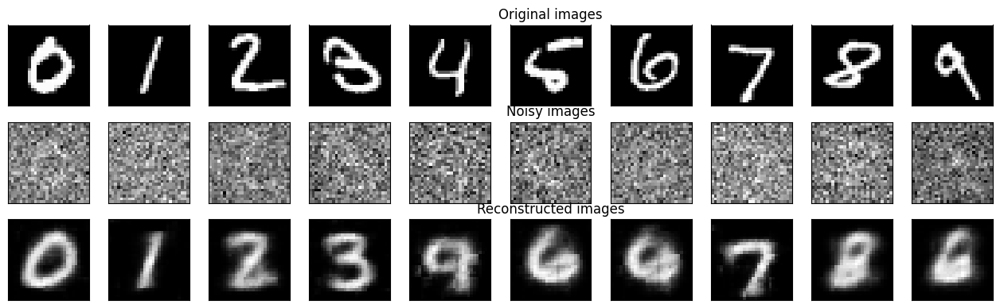


 EPOCH 2/10 	 train loss 0.21485595405101776 	 val loss 0.20889879763126373


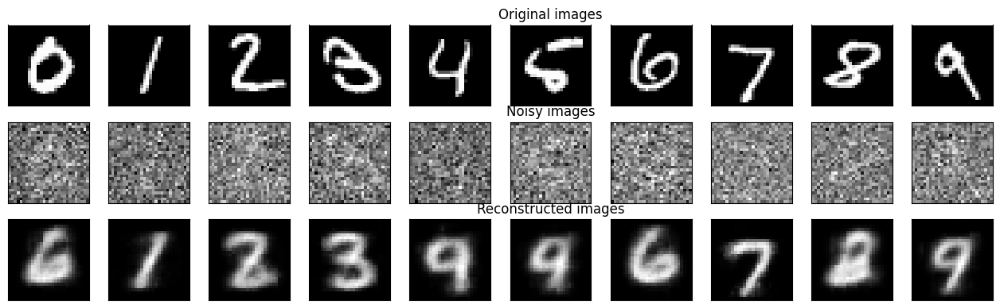


 EPOCH 3/10 	 train loss 0.21255835890769958 	 val loss 0.20482651889324188


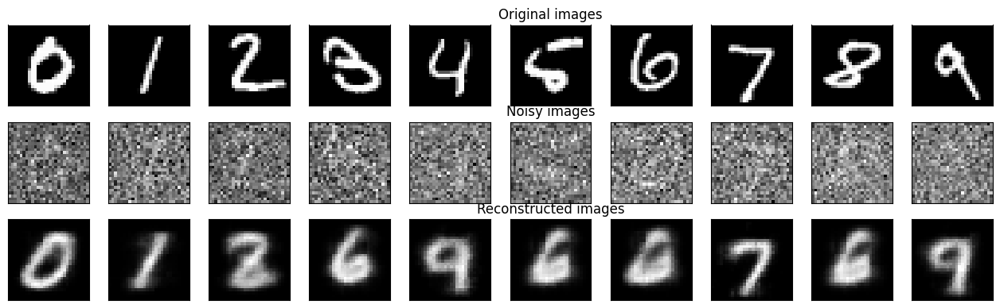


 EPOCH 4/10 	 train loss 0.21090461313724518 	 val loss 0.20370766520500183


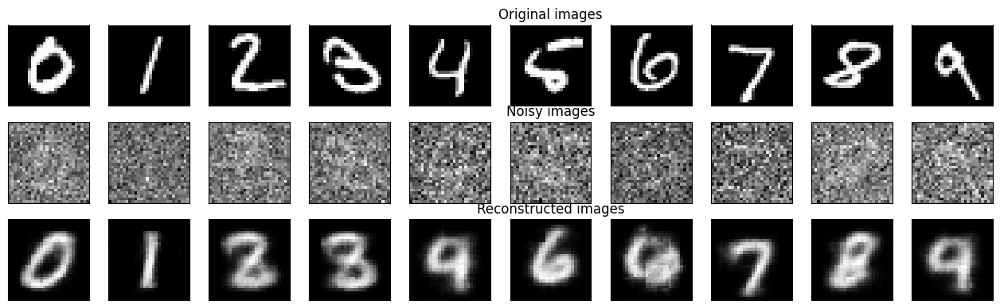


 EPOCH 5/10 	 train loss 0.2096482813358307 	 val loss 0.20402835309505463


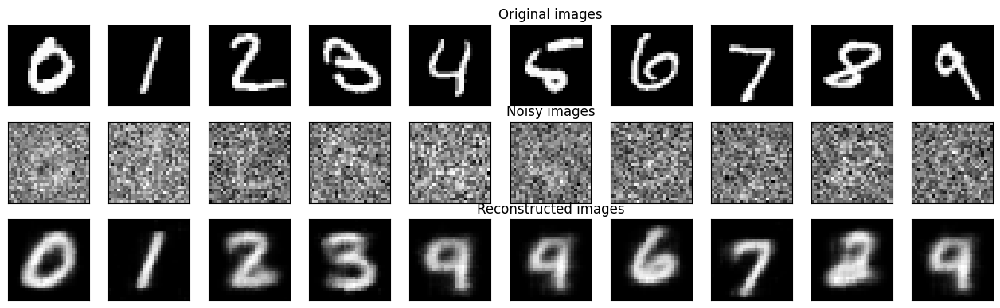


 EPOCH 6/10 	 train loss 0.208478644490242 	 val loss 0.2023162543773651


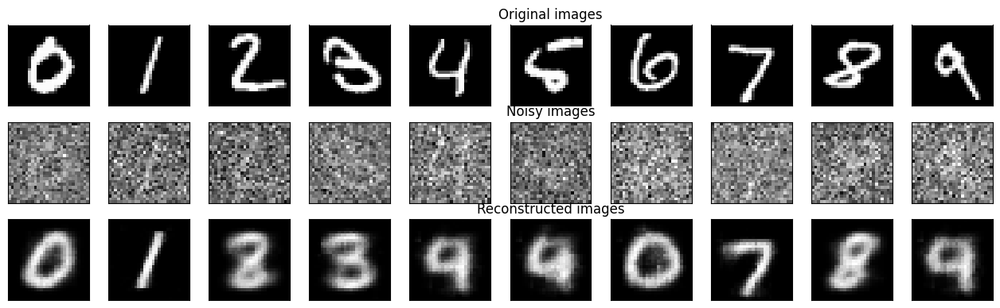


 EPOCH 7/10 	 train loss 0.20775409042835236 	 val loss 0.2020406424999237


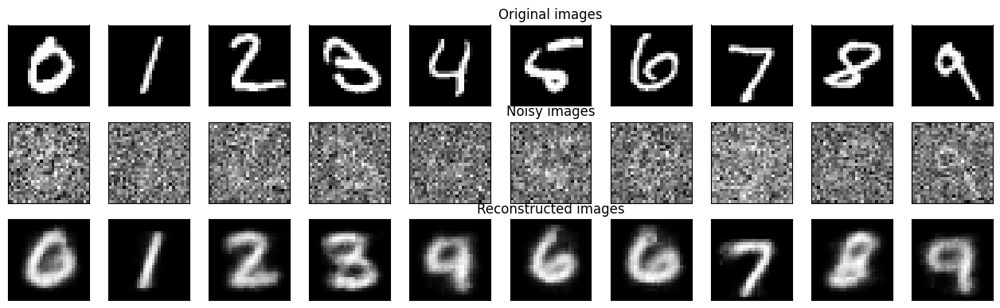


 EPOCH 8/10 	 train loss 0.20692729949951172 	 val loss 0.20072545111179352


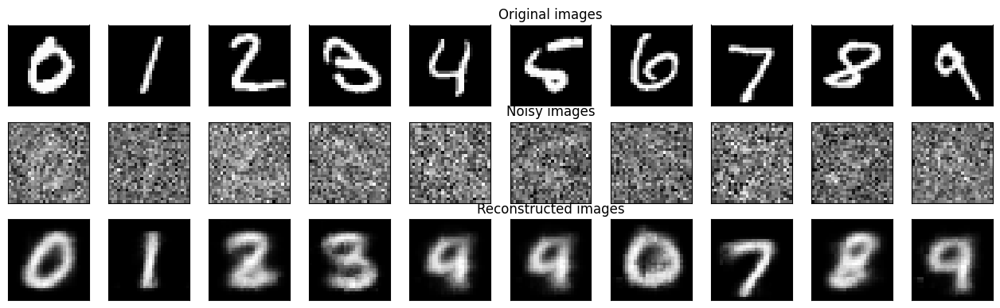


 EPOCH 9/10 	 train loss 0.20652219653129578 	 val loss 0.19910159707069397


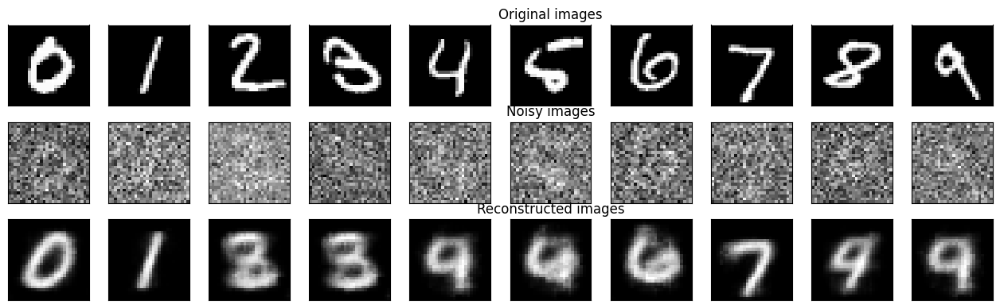


 EPOCH 10/10 	 train loss 0.20603670179843903 	 val loss 0.19814863801002502


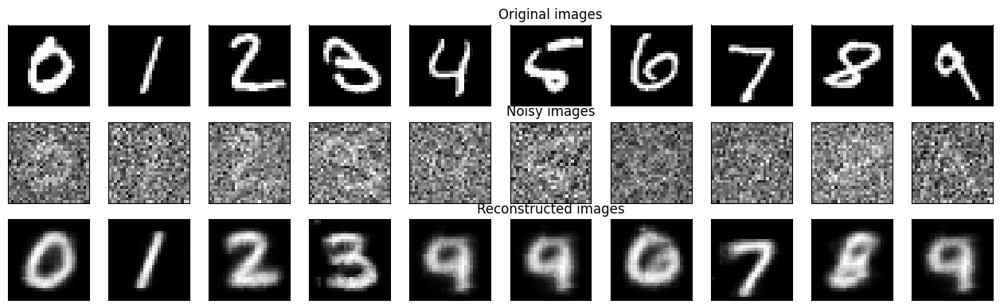

In [ ]:
# set the learning rate
lr = 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)

# set the latent space dimension
latent_dims = 2

# we then create the autoencoder
dae = DenoisingAutoEncoder(latent_dims)

# get the parameters
params_to_optimize = dae.parameters()

# and set the optimiser
optimizer = optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

# Move both the encoder and the decoder to the selected device
dae.to(device)

# set the loss function to optimise. As seen in class, it basically depends on
# the data, often MSE will be appropriate as you try to reconstruct the input,
# but in the special case where the input data is 0 or 1 (like for MNIST),
# Cross Entropy can be a better choice
# You should change this if you try CIFAR10!
loss_fn = nn.BCELoss()

num_epochs = 10
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
   train_loss = train_epoch(dae,device,train_loader,loss_fn,optimizer)
   val_loss = test_epoch(dae,device,test_loader,loss_fn)
   print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   diz_loss['train_loss'].append(train_loss)
   diz_loss['val_loss'].append(val_loss)
   plot_dae_outputs(dae,test_set,n=10)

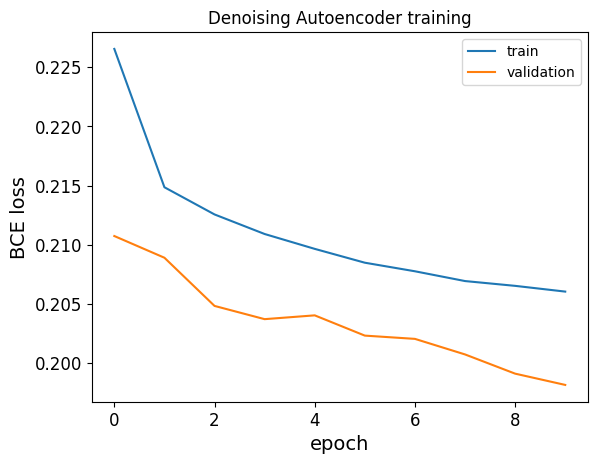

In [ ]:
plt.plot(diz_loss['train_loss'], label='train')
plt.plot(diz_loss['val_loss'], label='validation')
plt.xlabel('epoch')
plt.ylabel('BCE loss')
plt.title('Denoising Autoencoder training')
plt.legend()

### Interpolation

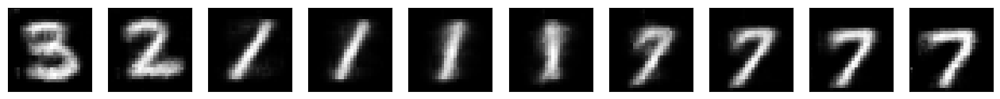

In [ ]:

# get indices of digits 1 to 10
targets = test_set.targets.numpy()
t_idx = {i:np.where(targets==i)[0][0] for i in range(10)}

img_d1 = test_set[t_idx[3]][0].unsqueeze(0).to(device)
lat_d1 = dae.encoder(img_d1)

img_d2 = test_set[t_idx[7]][0].unsqueeze(0).to(device)
lat_d2 = dae.encoder(img_d2)


plt.figure(figsize=(16,4.5))

# draw a linear space between the two latent vectors
for i,z in enumerate(torch.linspace(0,1,10)):
  ax = plt.subplot(1,10,i+1)

  lat = (1-z)*lat_d1 + z*lat_d2
  with torch.no_grad():
    rec = dae.decoder(lat)

    plt.imshow(rec.cpu().squeeze().numpy(), cmap='gist_gray')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    #ax.set_title('Reconstructed images')

plt.show()

### Visualisation

We can also show the embedding space as before.

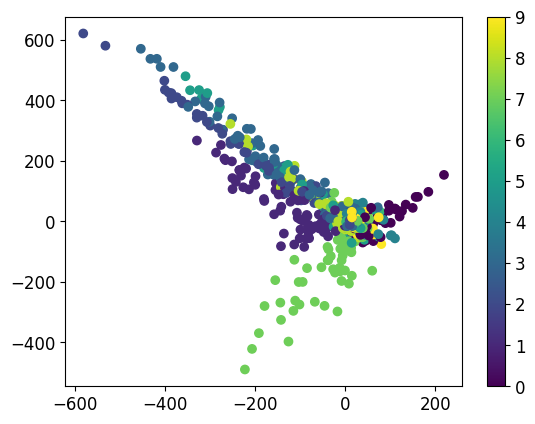

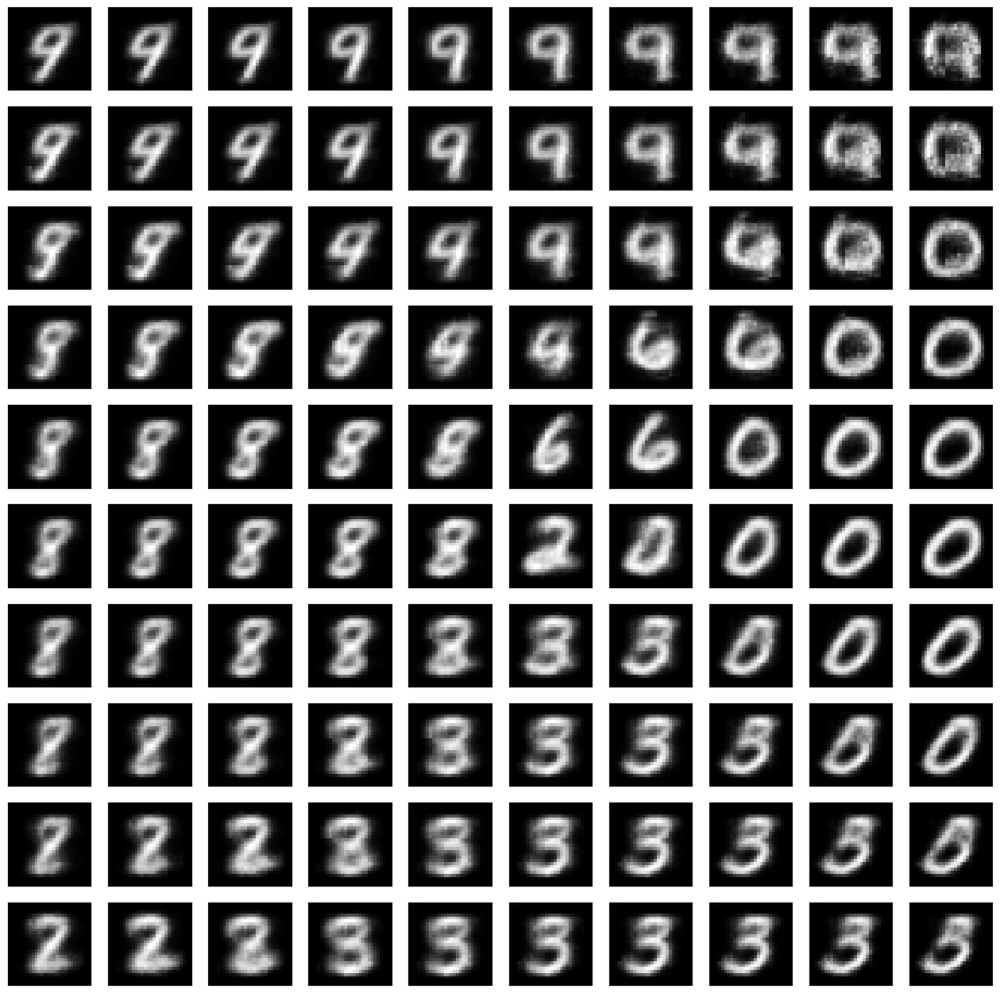

In [ ]:
show_latent(dae.encoder, test_set)
plot_embedding_space(dae, 10)

## Variational Autoencoders

Variational Autoencoders have been designed to learn better manifolds representing the dataset. We will now try and apply a VAE to the dataset.

Note that you can keep most of the architecture you used before, with the following differences:
1. Encoder: the encoder will need to output two values, for the mean $\mu$ and the log variance $\log\sigma^2$. You can do this by having *two* final linear layers at the end of your encoder, each taking the previous layer as input.
2. Sampling: This means you cannot pass the output of the encoder straight to the decoder anymore: you need to sample from the distribution defined by the mean and logvar.
3. The decoder can stay the same.
4. You will need to create a VAE class this time to encapsulate the encoding-sampling-decoding sequence.



### Model
We need a new class for the VAE. Similar to the AE case, it will contain the encoder and decoder, but in the forward function we need to also sample from our distribution.

In [ ]:
class VAE(nn.Module):
  def __init__(self, latent_dims=2, hidden_dims=128, beta=1.0, binary=True):
    super().__init__()

    self.latent_dims=latent_dims

    # for beta VAE
    self.beta = beta

    # main encoder code
    self.encoder = EncoderCNN(hidden_dims)

    # main decoder code
    self.decoder = DecoderCNN(latent_dims)

    # add layers for the distribution output
    self.mulayer = nn.Linear(hidden_dims,latent_dims)
    self.lvlayer = nn.Linear(hidden_dims,latent_dims)

    # note that BCE loss here is only appropriate if the data is effectively
    # binary. If regressing general values, the MSE loss would be appropriate
    if binary:
      self.rec_loss = nn.BCELoss(reduction='sum') # for binary inputs
    else:
      self.rec_loss = nn.MSELoss(reduction='sum')

  # sample a latent vector from distribution
  def sample(self, mu, lv):
    # get the variance from the log
    std = torch.exp(0.5*lv)
    # generate random numbers
    eps = torch.randn_like(std)
    # scale to the distribution
    return eps*std+mu
    #return eps.mul(std).add_(mu) # return z sample

  def encode(self,x):
    # main encoder part
    h = self.encoder(x)

    # mean layer
    mu = self.mulayer(h)

    # log-variance layer
    lv = self.lvlayer(h)

    return mu, lv

  def decode(self,z):
    return self.decoder(z)

  def forward(self,x):
    mu, lv = self.encode(x)

    if self.training:
      # sample from the distribution
      z = self.sample(mu, lv)
    else:
      z = mu

    # decode the sample
    return self.decoder(z)

  def kld_loss(self, mu, lv):
    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # - D_{KL} = 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    # note the negative D_{KL} in appendix B of the paper
    kld = -0.5 * torch.sum(1 + lv - mu.pow(2) - lv.exp(), dim=-1)
    return kld

  def vae_loss(self, x_hat, x, mu, lv, beta=None):
    if beta is None:
      beta = self.beta

    # the reconstruction loss
    rec =  self.rec_loss(x_hat, x)/x.shape[0] # normalize per batch size

    # the KLD loss to ensure that the latent distribution is close to prior
    kld = self.kld_loss(mu, lv)

    # we combine the twos (with beta weighting)
    return torch.mean(rec + beta*kld)

### Training function
def train_vae_epoch(vae, device, dataloader, optimizer):
    # Set train mode for both the encoder and the decoder
    vae.train()
    train_loss = []

    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)

        # encode+decode data0
        mu,lv = vae.encode(image_batch)
        z = vae.sample(mu,lv)
        x_hat = vae.decode(z)

        # Evaluate loss
        loss = vae.vae_loss(x_hat, image_batch, mu, lv)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # record the loss
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)


### Testing function
def test_vae_epoch(vae, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    vae.eval()
    val_loss = []
    val_error = []
    with torch.no_grad(): # No need to track the gradients
        for image_batch, _ in dataloader:

            # Move tensor to the proper device
            image_batch = image_batch.to(device)

            # Encode + Decode data
            decoded_data = vae(image_batch)

            # encode+decode data0
            mu,lv = vae.encode(image_batch)
            z = vae.sample(mu,lv)
            x_hat = vae.decode(z)

            # calculate the loss/error
            val_loss.append(vae.vae_loss(decoded_data, image_batch, mu, lv).detach().cpu().numpy())
            val_error.append(loss_fn(decoded_data, image_batch).detach().cpu().numpy())

    # we return the average loss over this epoch
    return np.mean(val_loss), np.mean(val_error)


### Training


 EPOCH 1/10 	 train loss 208.67161560058594 	 val loss 178.553955078125


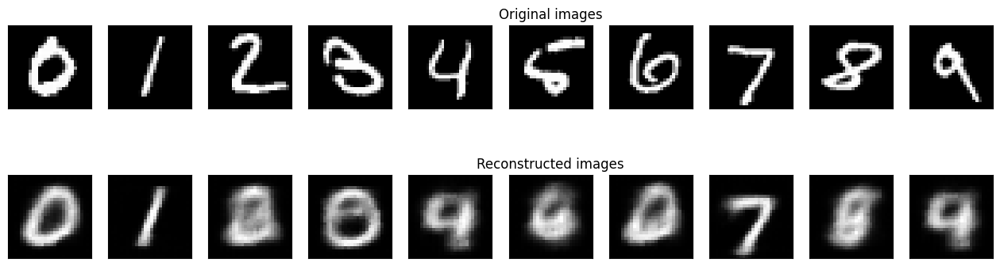


 EPOCH 2/10 	 train loss 178.14114379882812 	 val loss 173.20880126953125


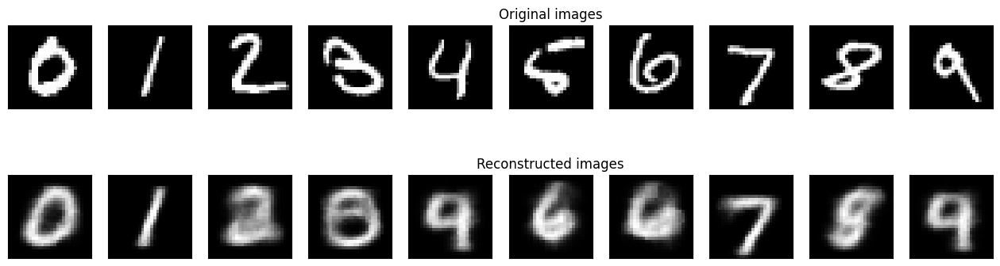


 EPOCH 3/10 	 train loss 174.97364807128906 	 val loss 170.48855590820312


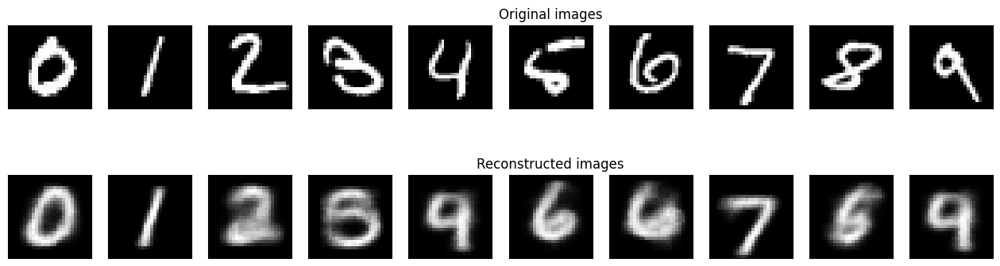


 EPOCH 4/10 	 train loss 173.21661376953125 	 val loss 169.35487365722656


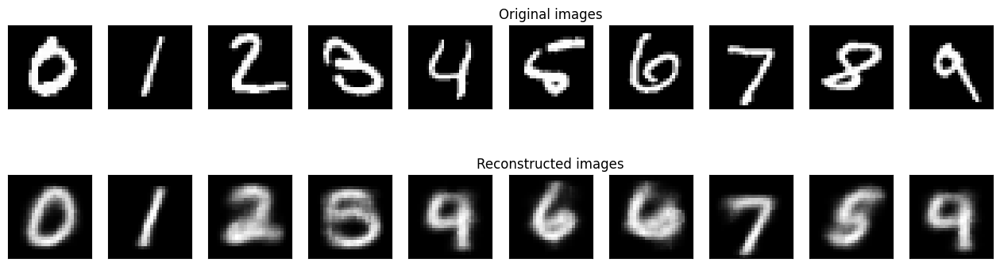


 EPOCH 5/10 	 train loss 172.03648376464844 	 val loss 169.82110595703125


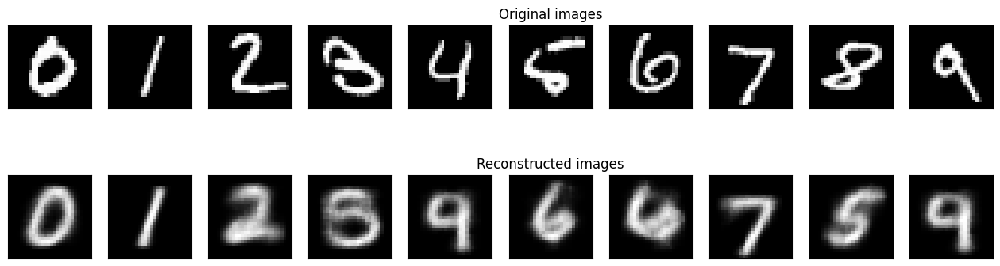


 EPOCH 6/10 	 train loss 171.01084899902344 	 val loss 167.0167694091797


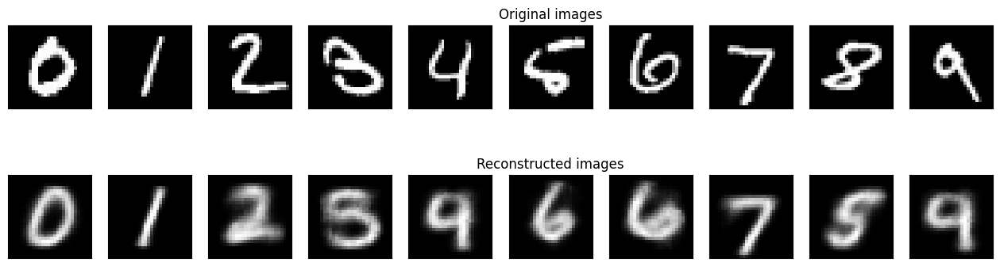


 EPOCH 7/10 	 train loss 170.22390747070312 	 val loss 165.61236572265625


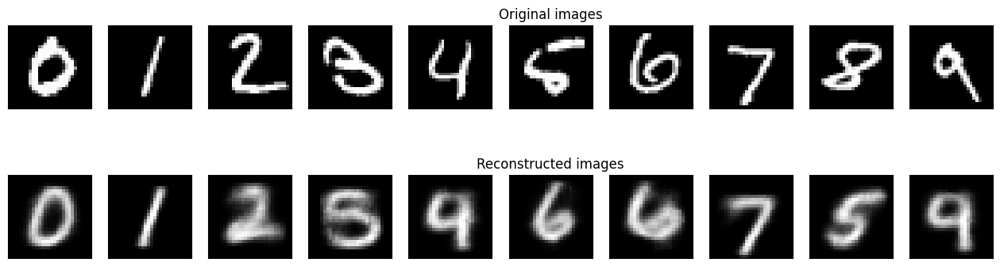


 EPOCH 8/10 	 train loss 169.4702606201172 	 val loss 166.02955627441406


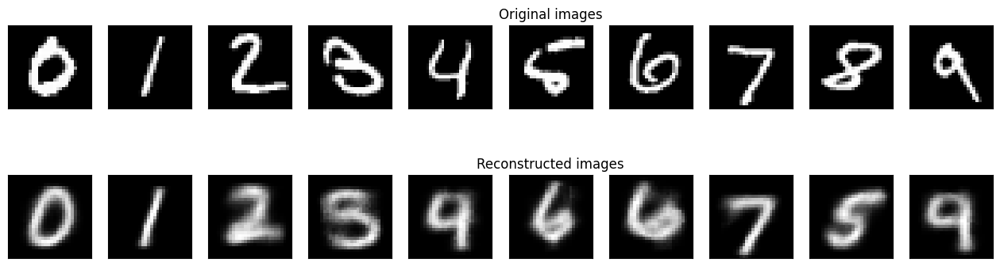


 EPOCH 9/10 	 train loss 168.85670471191406 	 val loss 165.2020263671875


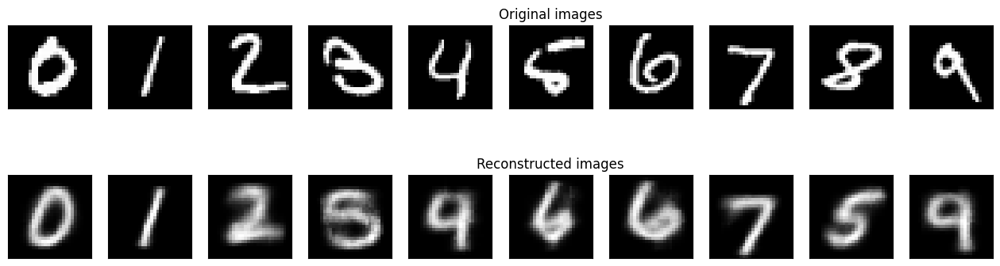


 EPOCH 10/10 	 train loss 168.35125732421875 	 val loss 165.5684814453125


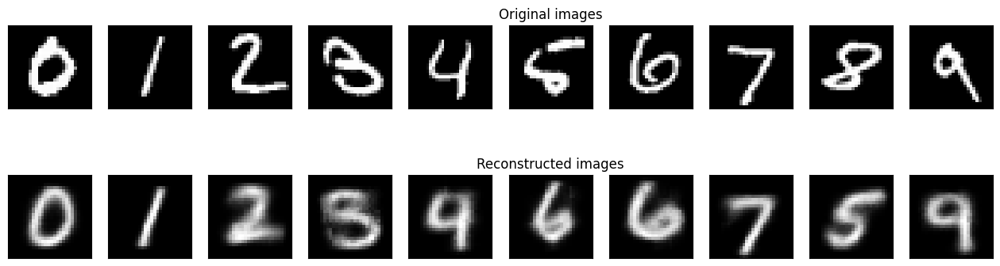

In [ ]:
# set the learning rate
lr = 0.001

# Set the random seed for reproducible results
torch.manual_seed(0)

# set the latent dimension (how big/small is the space in which you want to encode your inputs)
latent_dims = 2

# VAE typically require larger batch sizes
batch_size = 128

# set up a loader object to use minibatches (we set minibatch size to 32, you could easily push that up)
train_loader = torch.utils.data.DataLoader(train_set, batch_size = batch_size)

# also set up a loader for test data, using a single batch
test_loader = torch.utils.data.DataLoader(test_set)

# Initialize the two networks
vae = VAE(latent_dims, beta=5.0)
params_to_optimize = vae.parameters()
optimizer = optim.Adam(params_to_optimize, lr=lr)

# move the network to the GPU
vae.to(device)

num_epochs = 10
diz_loss = {'train_loss':[],'val_loss':[],'val_error':[]}
for epoch in range(num_epochs):
   train_loss = train_vae_epoch(vae,device,train_loader,optimizer)
   #if epoch % 10 == 0:
   val_loss,val_error = test_vae_epoch(vae, device, test_loader, nn.BCELoss())
   print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   diz_loss['train_loss'].append(train_loss)
   diz_loss['val_loss'].append(val_loss)
   diz_loss['val_error'].append(val_error)
   plot_ae_outputs(vae,test_set,n=10)

Text(0.5, 1.0, 'Validation error')

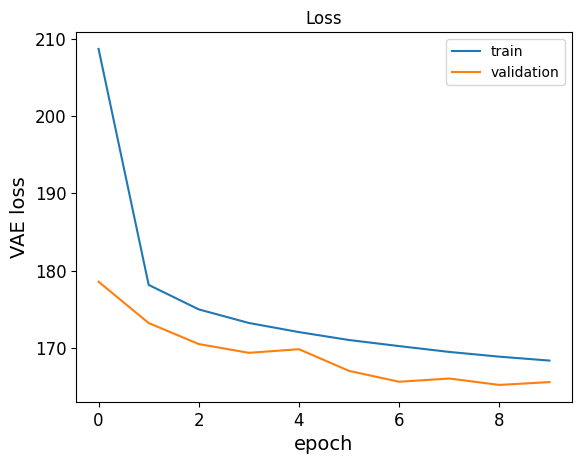

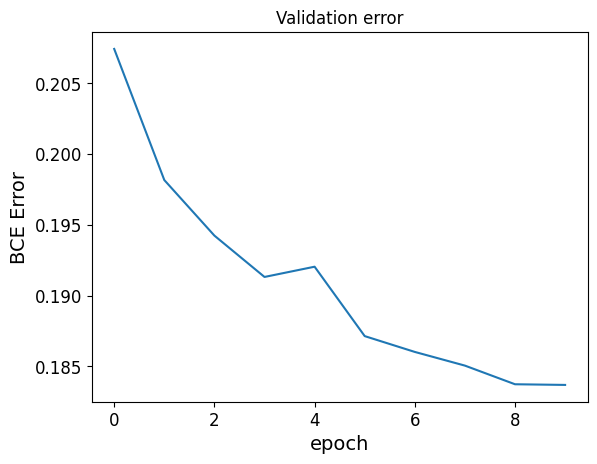

In [ ]:
# we can plot the loss as before
plt.plot(diz_loss['train_loss'], label='train')
plt.plot(diz_loss['val_loss'], label='validation')
plt.xlabel('epoch')
plt.ylabel('VAE loss')
plt.title('Loss')
plt.legend()

# and the reconstruction error only for better comparison
plt.figure()
plt.plot(diz_loss['val_error'], label='validation')
plt.xlabel('epoch')
plt.ylabel('BCE Error')
plt.title('Validation error')


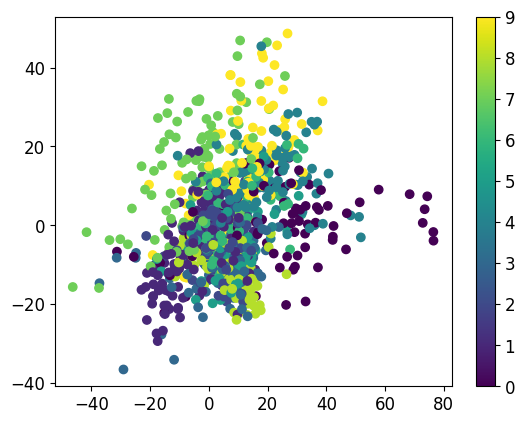

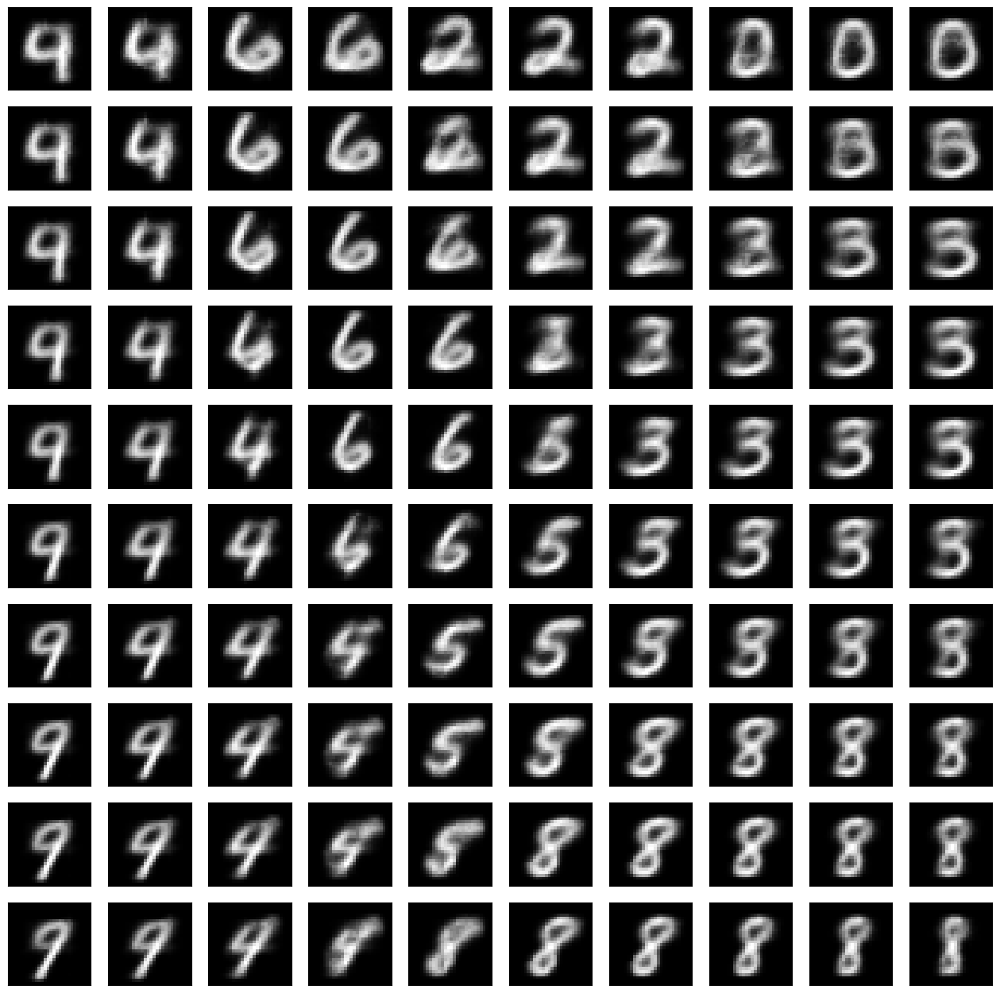

In [ ]:
show_latent(vae.encoder, test_set)
plot_embedding_space(vae, 10)

### Interpolation

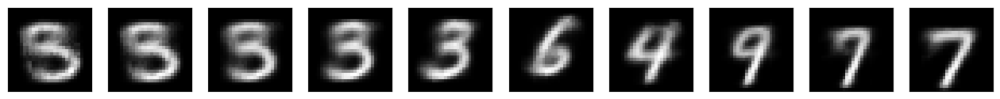

In [ ]:

# get indices of digits 1 to 10
targets = test_set.targets.numpy()
t_idx = {i:np.where(targets==i)[0][0] for i in range(10)}

img_d1 = test_set[t_idx[3]][0].unsqueeze(0).to(device)
mu1,lv1 = vae.encode(img_d1)
img_d2 = test_set[t_idx[7]][0].unsqueeze(0).to(device)
mu2,lv2 = vae.encode(img_d2)


plt.figure(figsize=(16,4.5))

# draw a linear space between the two latent vectors
for i,z in enumerate(torch.linspace(0,1,10)):
  ax = plt.subplot(1,10,i+1)

  lat = (1-z)*mu1 + z*mu2
  with torch.no_grad():
    rec = vae.decoder(lat)

    plt.imshow(rec.cpu().squeeze().numpy(), cmap='gist_gray')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    #ax.set_title('Reconstructed images')

plt.show()

# Homework
- Compare the results and embedding spaces for the different autoencoder variants presented here.
- Experiment with different parameters, try to train the models for more epochs.
- try to implement a beta-VAE.
- you can also experiment with another dataset such as fashionMNIST.